In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix


In [9]:
import pandas as pd

# Specify the file path
file_path = r'C:\Users\sunda\Desktop\Devops\class 4\SILKYSKY_DATA_CW2 (S).csv'

# Load the CSV file with encoding specified
df = pd.read_csv(file_path, encoding='ISO-8859-1')  # or 'latin1'

# Find the minimum age assuming the column containing age is called 'Age'
min_age = df['Age'].min()

# Display the minimum age
print(f"The minimum age is: {min_age}")


The minimum age is: 7


In [10]:

file_path = r'C:\Users\sunda\Desktop\Devops\class 4\SILKYSKY_DATA_CW2 (S).csv'
data = pd.read_csv(file_path, encoding='ISO-8859-1')

In [6]:
data.head()

,Ref,id,Gender,Satisfied,Age,Age Band,Type of Travel,Class,Flight Distance,Destination,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,0,70172,Male,Y,13,Under 18,Personal Travel,Eco Plus,4760,India,...,5,5,4,3,4,4,5,5,25,18.0
1,1,5047,Male,N,25,25 to 34,Business travel,Business,235,Republic of Ireland,...,1,1,1,5,3,1,4,1,1,6.0
2,2,110028,Female,Y,26,25 to 34,Business travel,Business,4760,India,...,5,5,4,3,4,4,4,5,0,0.0
3,3,24026,Female,Y,25,25 to 34,Business travel,Business,560,Norway,...,2,2,2,5,3,1,4,2,11,9.0
4,4,119299,Male,Y,61,55 to 64,Business travel,Business,4760,India,...,5,3,3,4,4,3,3,3,0,0.0


In [7]:


# Convert 'Satisfied' column to numerical values
data['Satisfied'] = data['Satisfied'].map({'Y': 1, 'N': 0})


In [87]:
data.head()

,Ref,id,Gender,Satisfied,Age,Age Band,Type of Travel,Class,Flight Distance,Destination,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,0,70172,Male,1,13,Under 18,Personal Travel,Eco Plus,4760,India,...,5,5,4,3,4,4,5,5,25,18.0
1,1,5047,Male,0,25,25 to 34,Business travel,Business,235,Republic of Ireland,...,1,1,1,5,3,1,4,1,1,6.0
2,2,110028,Female,1,26,25 to 34,Business travel,Business,4760,India,...,5,5,4,3,4,4,4,5,0,0.0
3,3,24026,Female,1,25,25 to 34,Business travel,Business,560,Norway,...,2,2,2,5,3,1,4,2,11,9.0
4,4,119299,Male,1,61,55 to 64,Business travel,Business,4760,India,...,5,3,3,4,4,3,3,3,0,0.0


In [8]:
data.tail()

,Ref,id,Gender,Satisfied,Age,Age Band,Type of Travel,Class,Flight Distance,Destination,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
103899,103899,94171,Female,0,23,18 to 24,Business travel,Eco,4760,India,...,2,2,3,1,4,2,3,2,3,0.0
103900,103900,73097,Male,1,49,45 to 54,Business travel,Business,4760,India,...,5,5,5,5,5,5,5,4,0,0.0
103901,103901,68825,Male,0,30,25 to 34,Business travel,Business,4760,India,...,5,4,3,2,4,5,5,4,7,14.0
103902,103902,54173,Female,0,22,18 to 24,Business travel,Eco,4760,India,...,1,1,4,5,1,5,4,1,0,0.0
103903,103903,62567,Male,1,27,25 to 34,Business travel,Business,4760,India,...,1,1,1,1,4,4,3,1,0,0.0


In [10]:
data.describe()


,Ref,id,Satisfied,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,...,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,51951.500000,64924.210502,0.817293,39.379706,4164.071066,2.522319,3.060248,2.756852,2.976825,3.202023,...,3.398666,3.358071,3.382247,3.350930,3.631708,3.304185,3.640331,3.286245,14.818390,15.181275
std,29994.645522,37463.812252,0.386428,15.114964,1346.755749,1.447848,1.525143,1.398993,1.277703,1.329625,...,1.365819,1.333104,1.288478,1.315715,1.181056,1.265501,1.175822,1.312373,38.313911,38.774453
min,0.000000,1.000000,0.000000,7.000000,235.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25975.750000,32533.750000,1.000000,27.000000,4760.000000,1.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,51951.500000,64856.500000,1.000000,40.000000,4760.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,77927.250000,97368.250000,1.000000,51.000000,4760.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,1.000000,85.000000,5940.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [11]:
data.isnull().sum()


Ref                                    0
id                                     0
Gender                                 0
Satisfied                              0
Age                                    0
Age Band                               0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Destination                            0
Continent                              0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness     

By EDA method

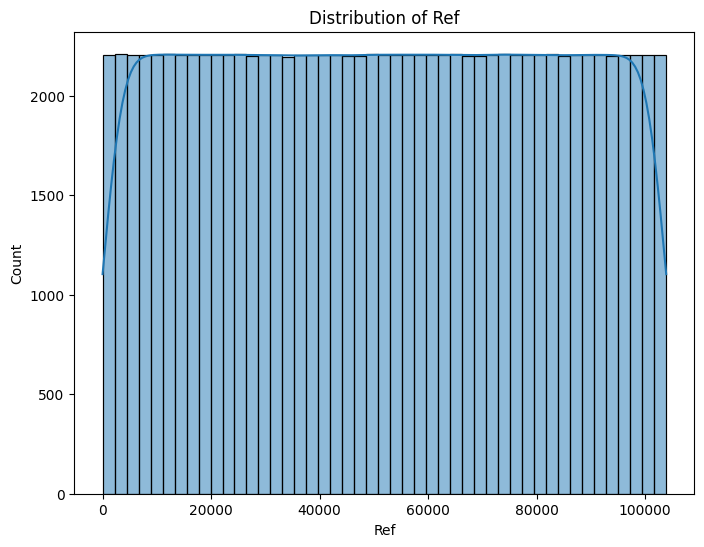

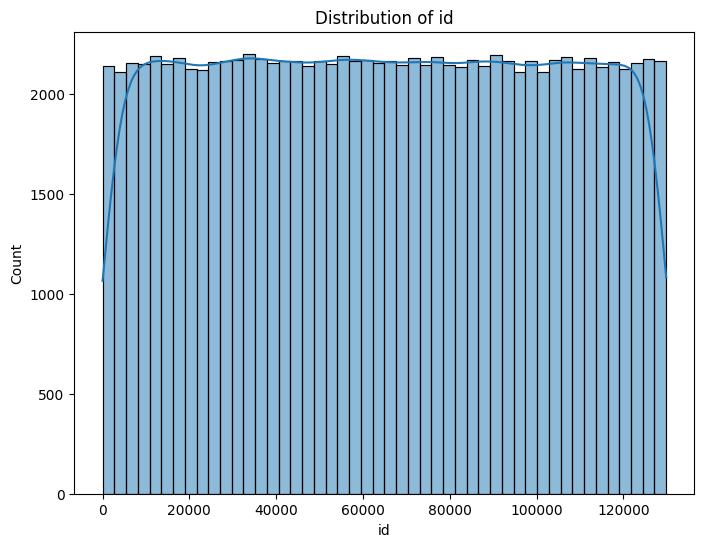

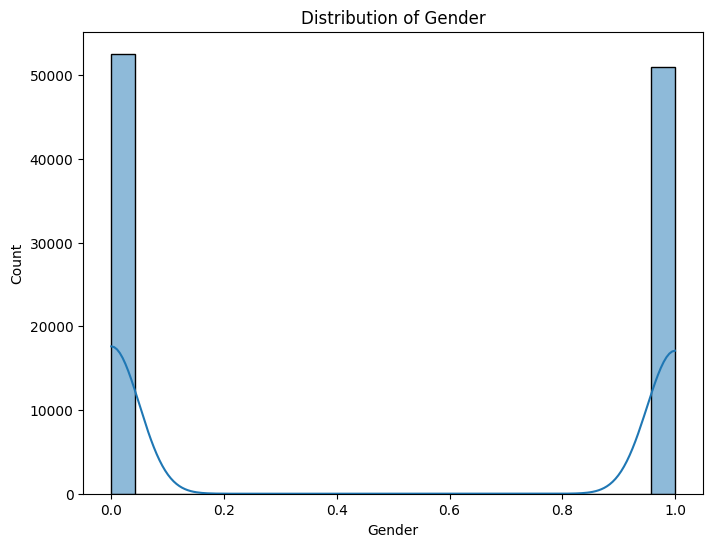

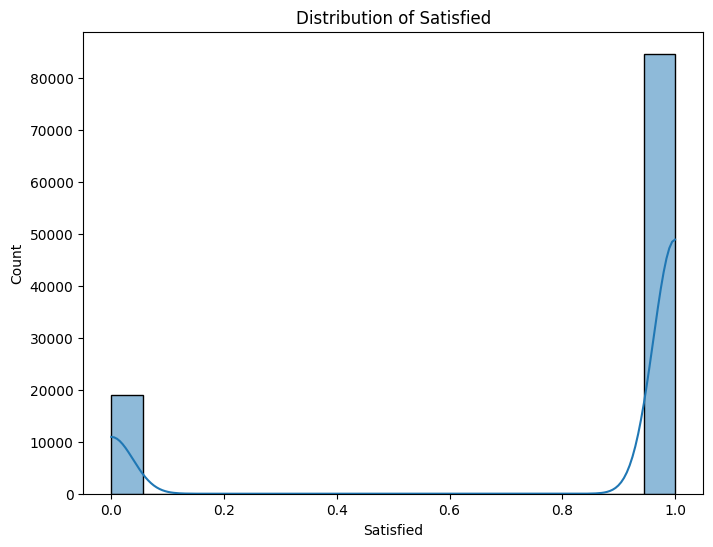

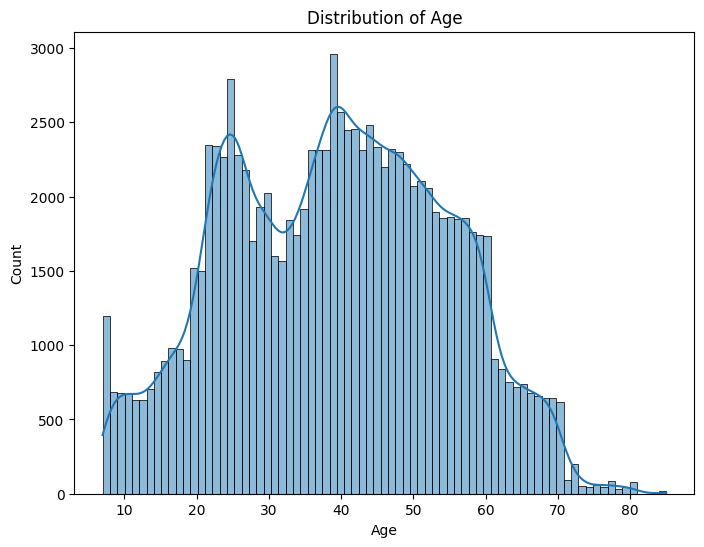

...

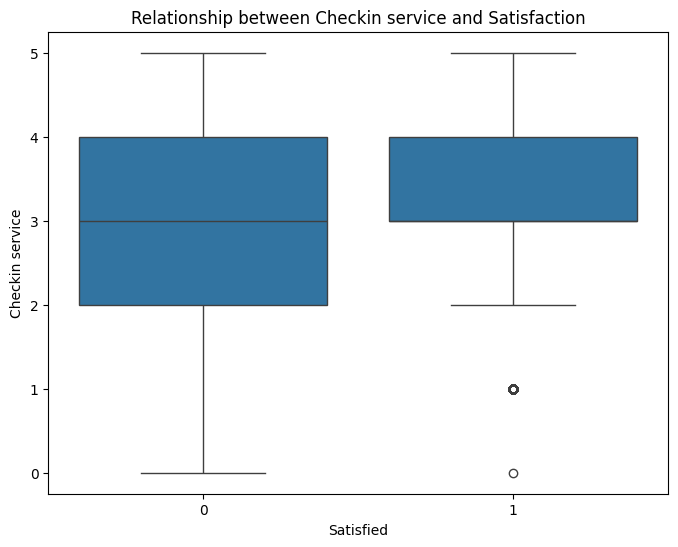

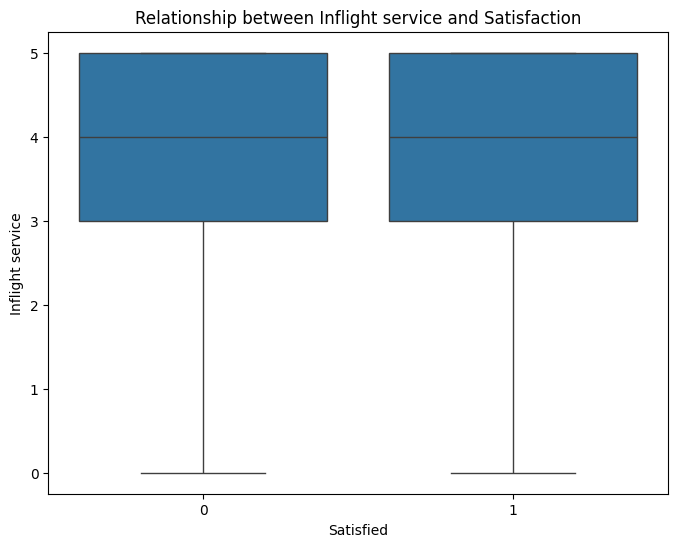

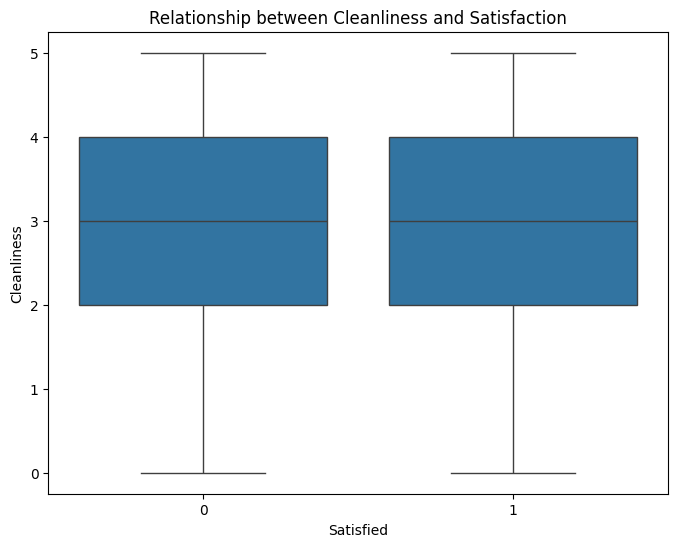

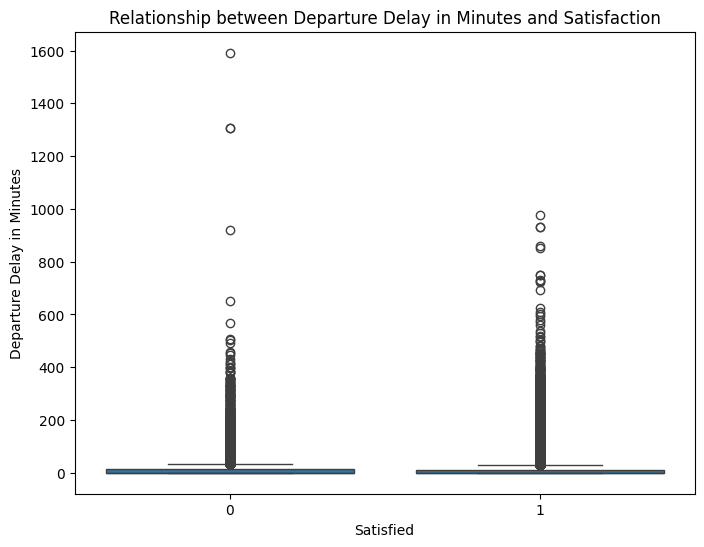

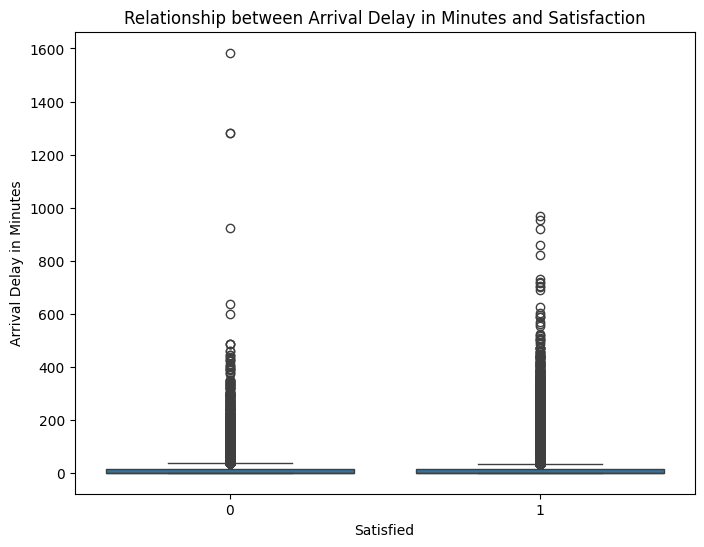

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns # Added import for seaborn

# Drop rows with missing values (if any)
data.dropna(inplace=True)

# Explore data distribution for numerical features #name of the numerical feature

numerical_features = data.select_dtypes(include=np.number).columns #Selects only the numerical columns from the DataFrame.
for feature in numerical_features:
  plt.figure(figsize=(8, 6))
  sns.histplot(data[feature], kde=True) #sns.histplot(), which visualizes the distribution. kde=True adds a kernel density estimate curve, which smooths the distribution.
  plt.title(f'Distribution of {feature}')
  plt.show()

# Explore data distribution for categorical features
categorical_features = data.select_dtypes(include='object').columns #Selects only the categorical columns (often represented as strings or objects).
for feature in categorical_features:
  plt.figure(figsize=(8, 6))
  sns.countplot(x=feature, data=data) #sns.countplot(), which shows the frequency of each category
  plt.title(f'Distribution of {feature}')
  plt.xticks(rotation=45) #xticks(rotation=45) rotates the x-axis labels by 45 degrees for better readability
  plt.show()

# Analyze correlation between features
correlation_matrix = data.corr(numeric_only=True) # Added numeric_only=True #data.corr(numeric_only=True): Computes the correlation matrix for numerical features, which measures the relationship between pairs of numerical columns.
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm') #annot=True adds the correlation values inside the cells, and 
                                                             #cmap='coolwarm' provides a color gradient from cool to warm tones.
plt.title('Correlation Matrix')
plt.show()

# Explore relationship between features and target variable
for feature in numerical_features:
  plt.figure(figsize=(8, 6))
  sns.boxplot(x='Satisfied', y=feature, data=data)
  plt.title(f'Relationship between {feature} and Satisfaction')
  plt.show()
  #This loop creates a box plot for each numerical feature, showing the distribution of the feature values across the 'Satisfied' categories (which was earlier mapped to 1 for 'Y' and 0 for 'N'). This helps identify how satisfaction correlates with each numerical feature.

for feature in categorical_features:
  plt.figure(figsize=(8, 6))
  sns.countplot(x=feature, hue='Satisfied', data=data)
  plt.title(f'Relationship between {feature} and Satisfaction')
  plt.xticks(rotation=45)
  plt.show()
  #his loop creates a count plot for each categorical feature, showing how 'Satisfied' (Y/N) varies across different categories of the feature. The hue='Satisfied' distinguishes the counts of satisfied and unsatisfied users

Bagging technique

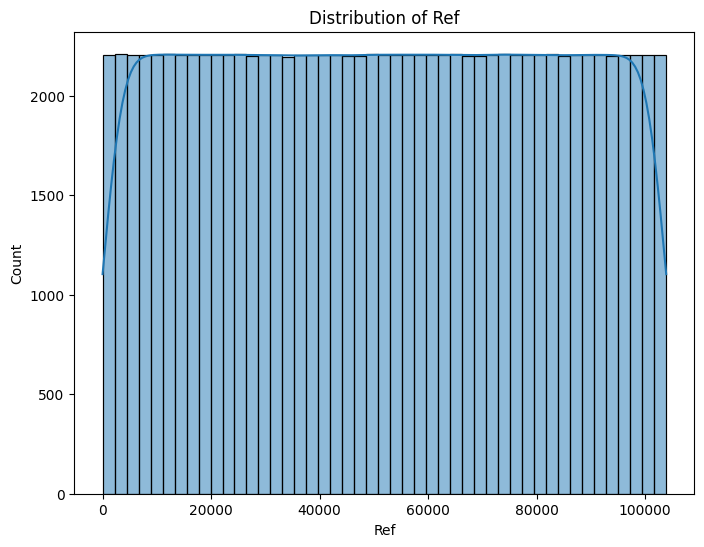

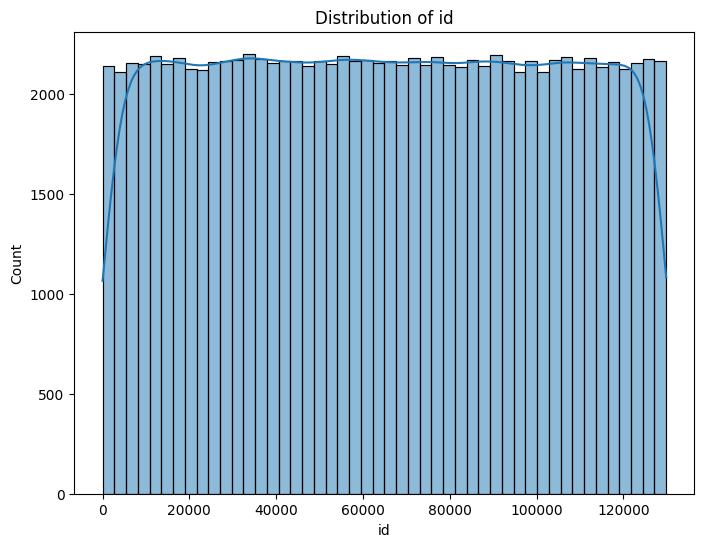

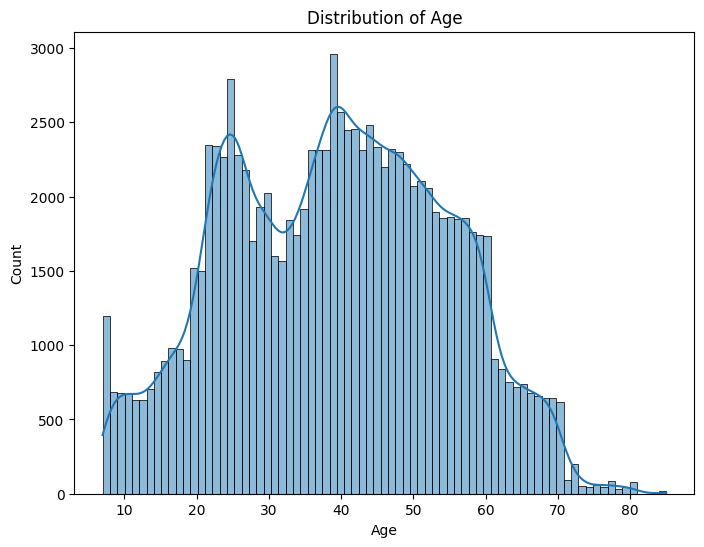

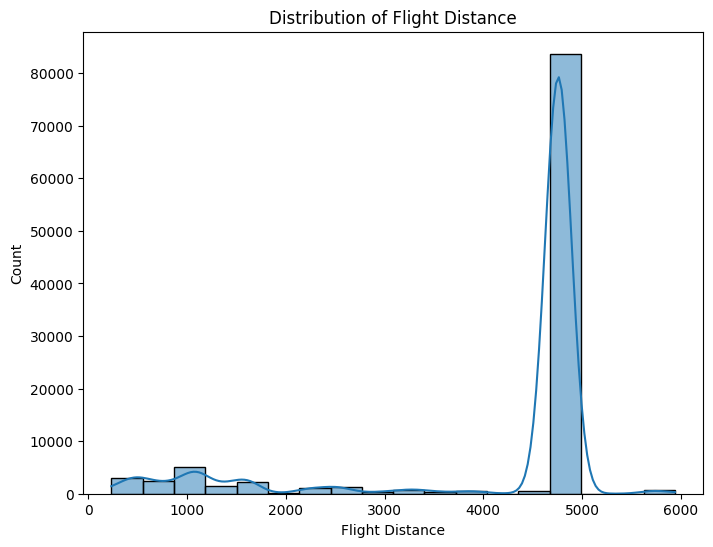

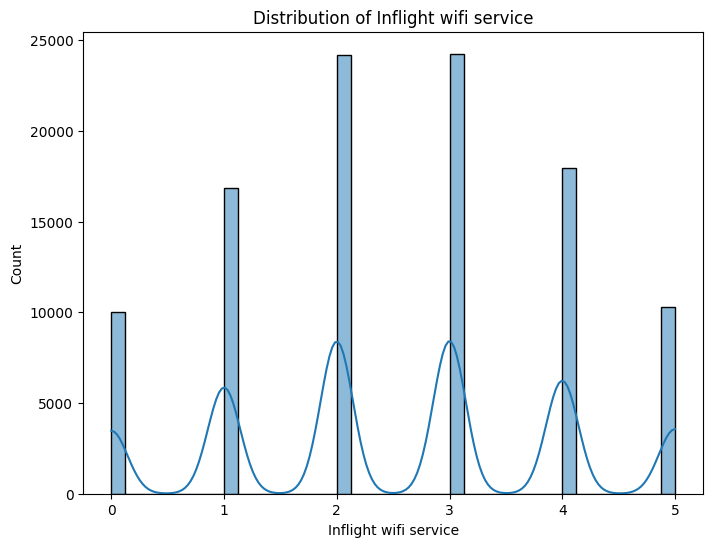

...

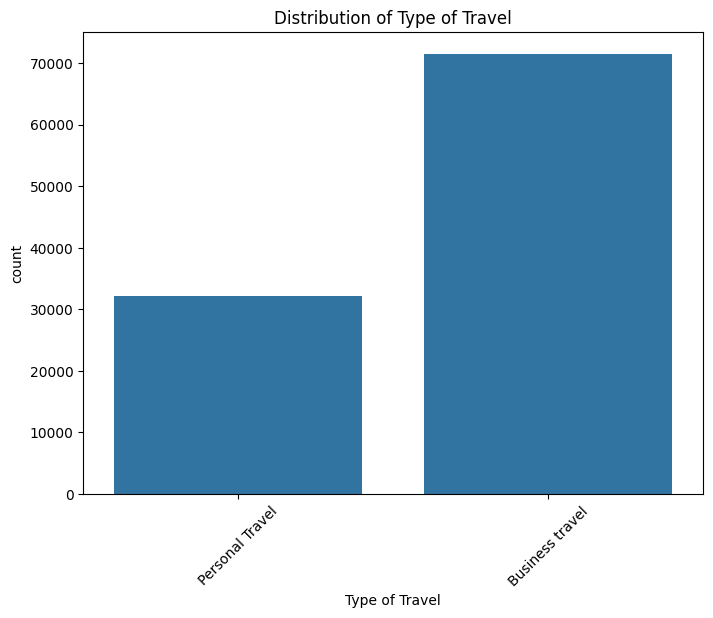

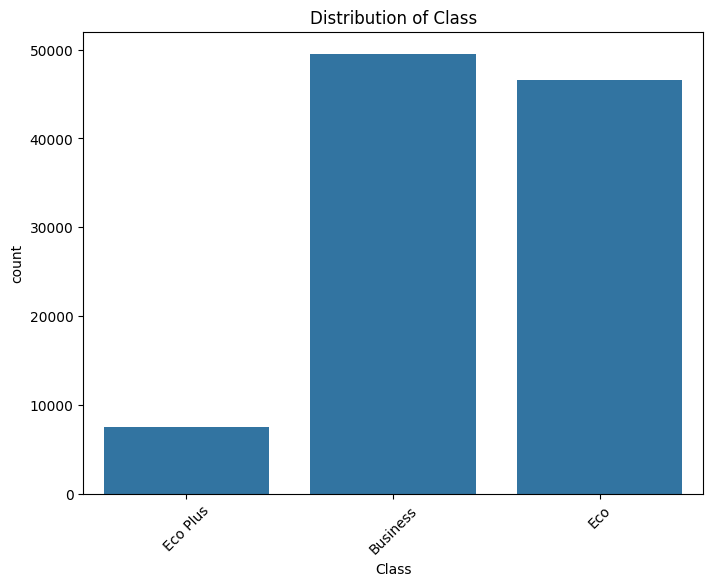

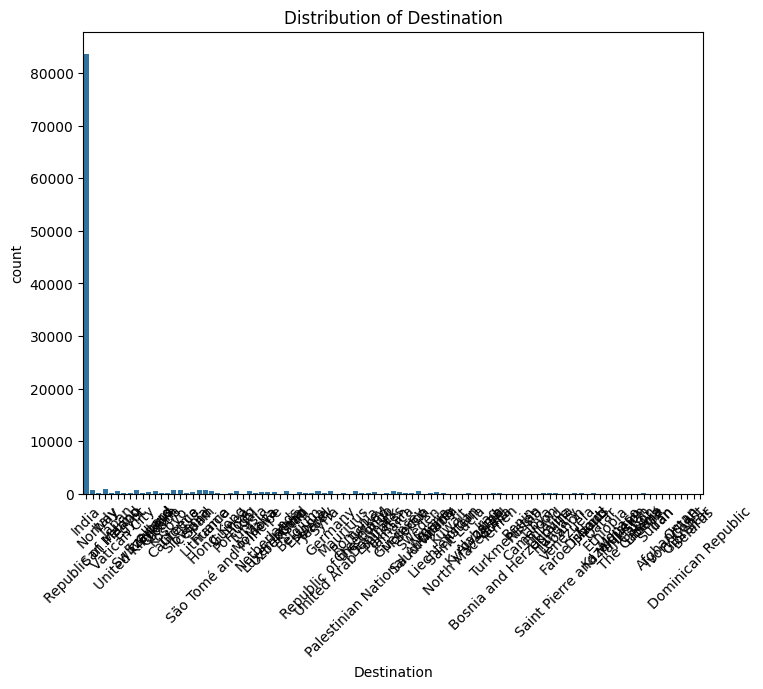

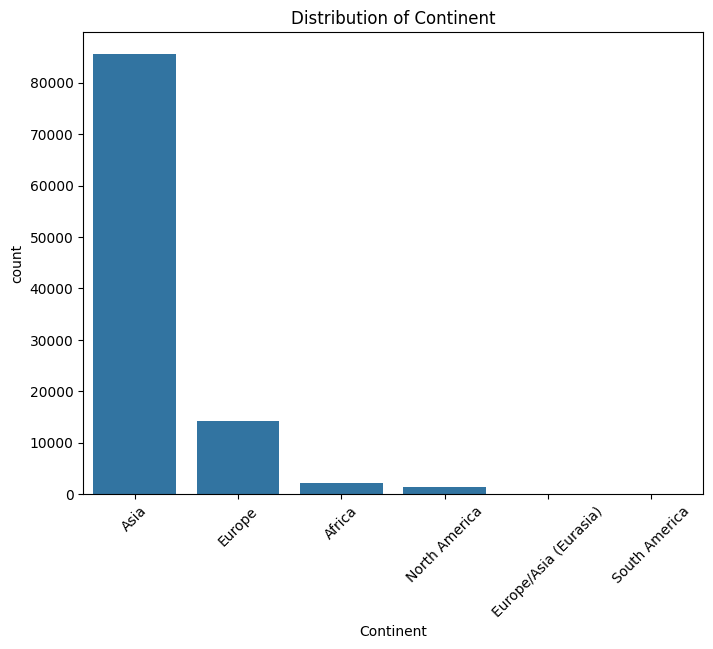

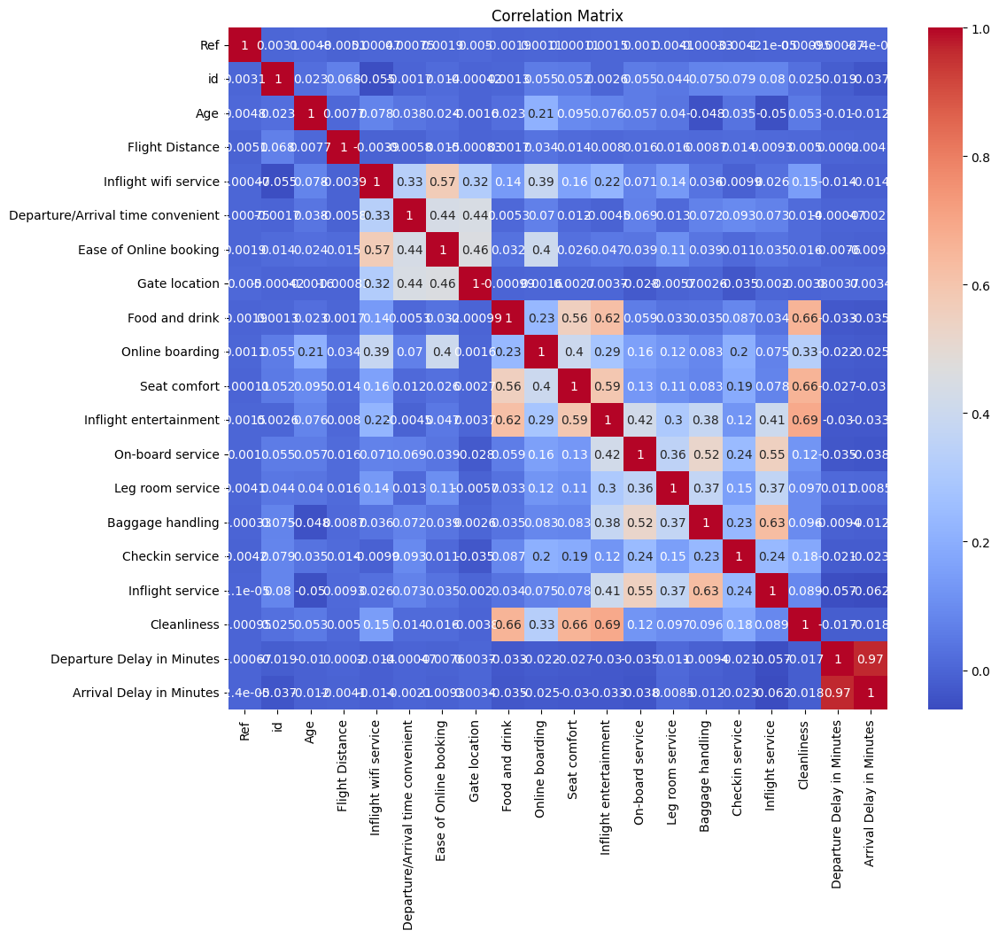

c:\Users\sunda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\sunda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

Accuracy: 0.861288973261688
Confusion Matrix:
[[ 2222  3453]
 [  858 24546]]
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.39      0.51      5675
           1       0.88      0.97      0.92     25404

    accuracy                           0.86     31079
   macro avg       0.80      0.68      0.71     31079
weighted avg       0.85      0.86      0.84     31079



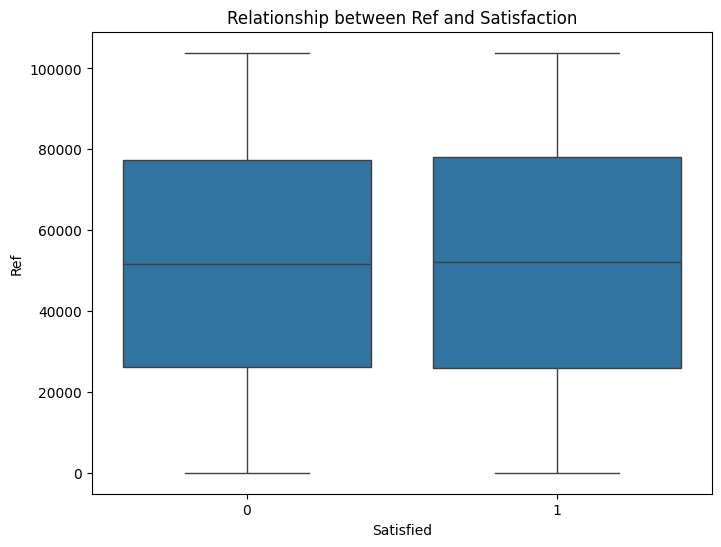

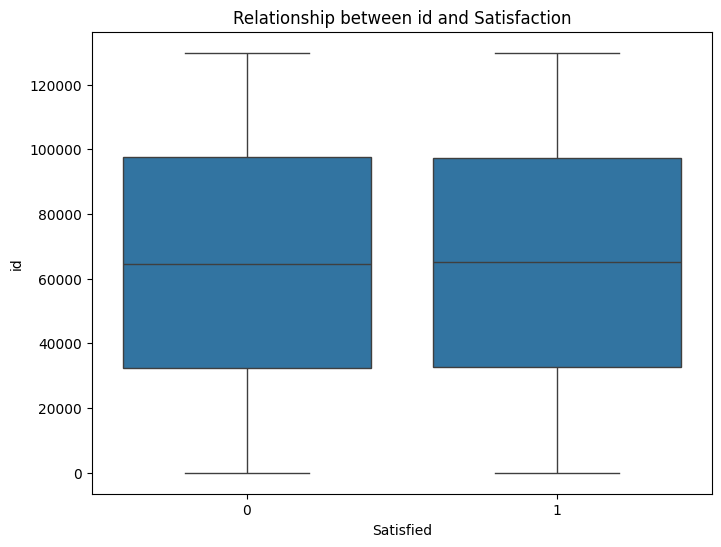

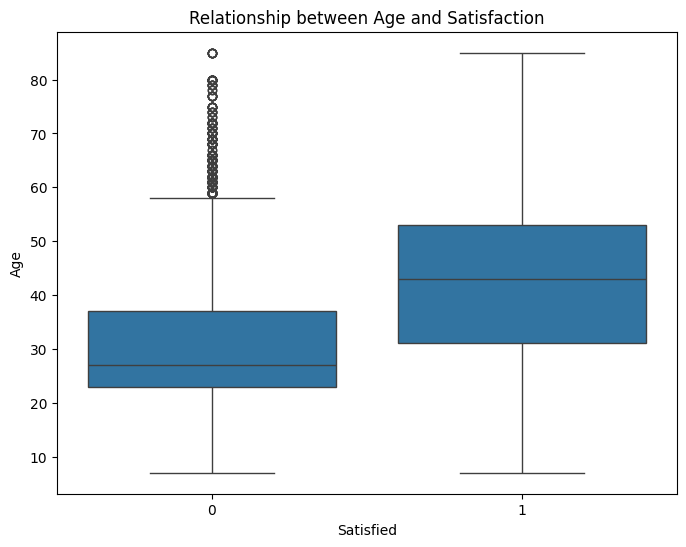

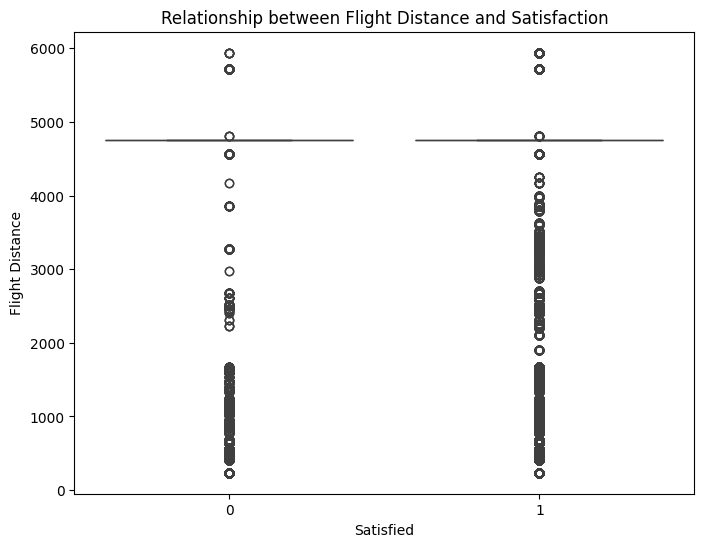

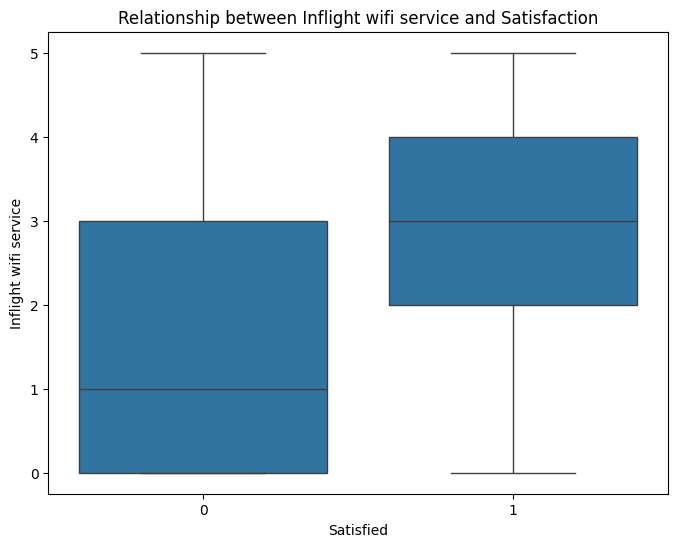

...

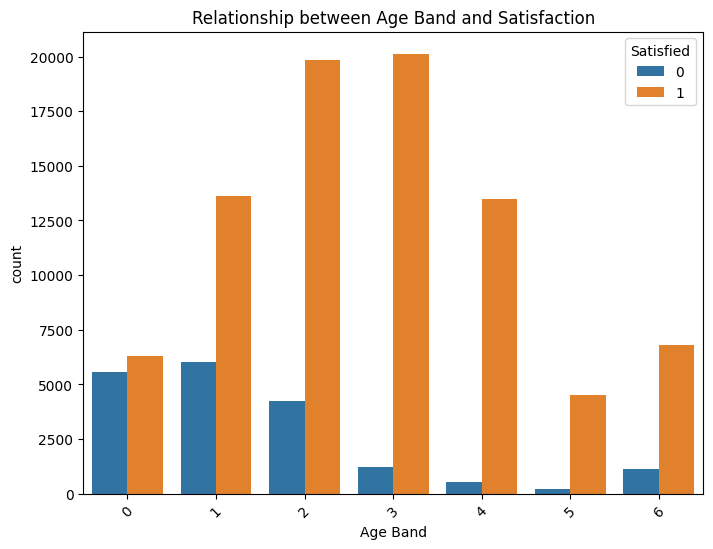

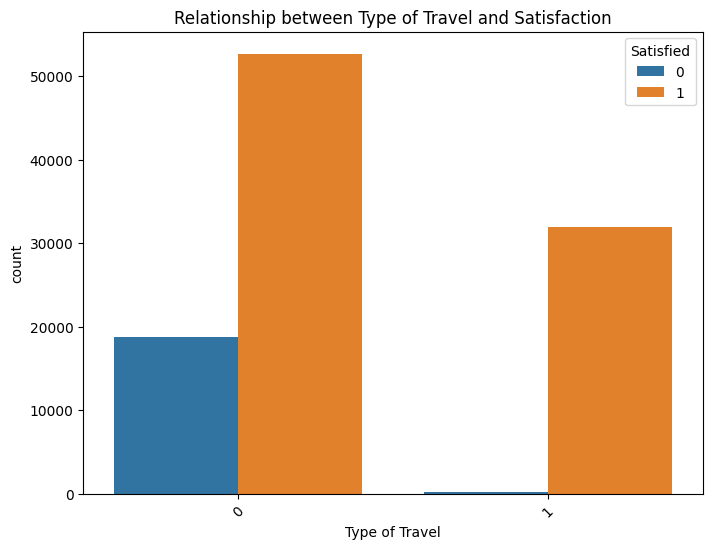

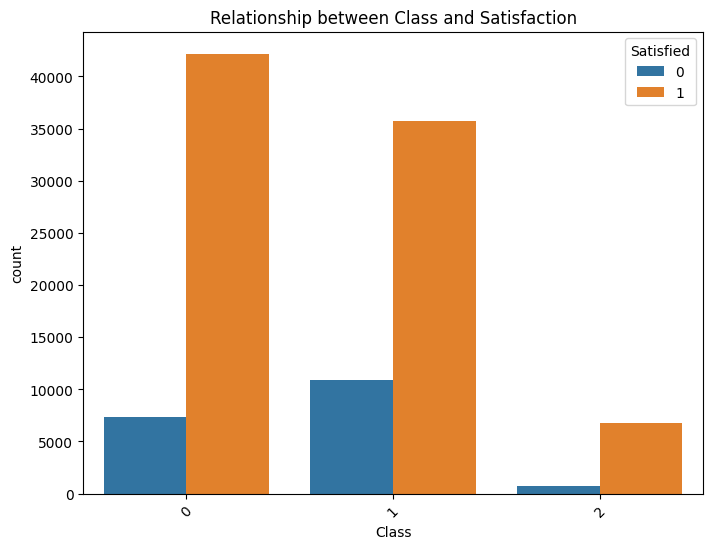

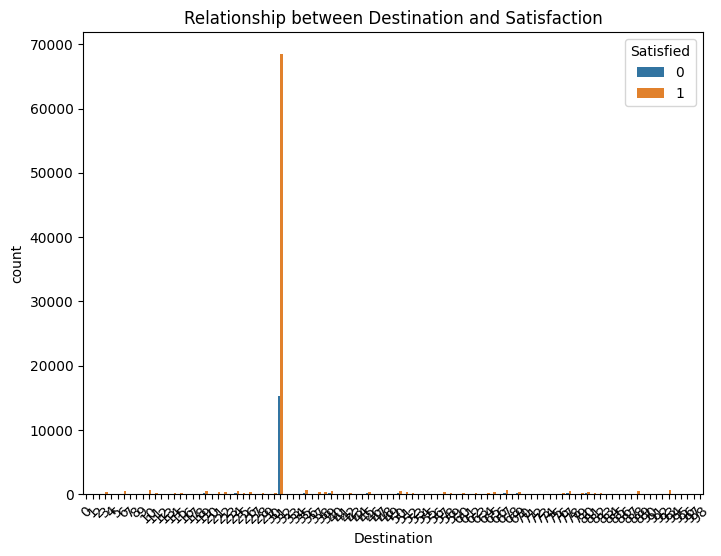

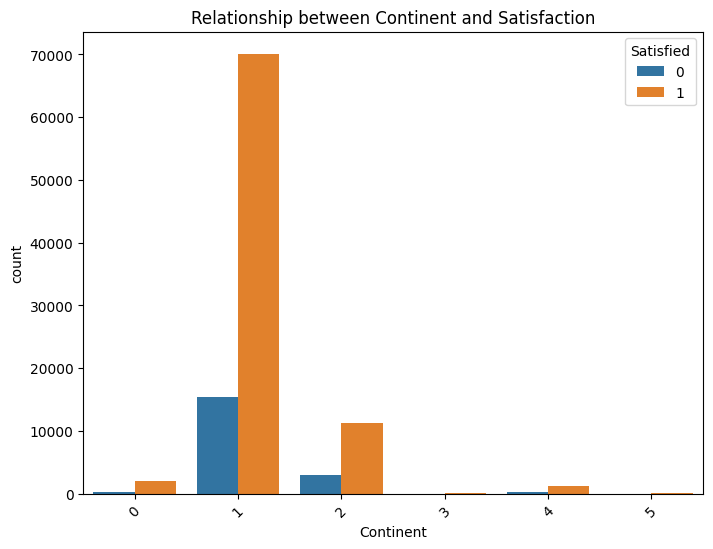

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd  # Import pandas for data handling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load the dataset (replace 'your_file.csv' with your actual file path)
file_path = r'C:\\Users\\sunda\\Desktop\\Devops\\class 4\\SILKYSKY_DATA_CW2 (S).csv'
data = pd.read_csv(file_path, encoding='ISO-8859-1')

# Drop rows with missing values (if any)
data.dropna(inplace=True)

# Explore data distribution for numerical features
numerical_features = data.select_dtypes(include=np.number).columns
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Explore data distribution for categorical features
categorical_features = data.select_dtypes(include='object').columns
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=feature, data=data)
    plt.title(f'Distribution of {feature}')
    plt.xticks(rotation=45)
    plt.show()

# Analyze correlation between features
correlation_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Encode categorical variables for the model
label_encoder = LabelEncoder()
for feature in categorical_features:
    data[feature] = label_encoder.fit_transform(data[feature])

# Define feature variables (X) and target variable (y)
X = data.drop(columns='Satisfied')  # Assuming 'Satisfied' is the target variable
y = data['Satisfied']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the BaggingClassifier with Logistic Regression as the base estimator
base_estimator = LogisticRegression(max_iter=1000)
bagging_classifier = BaggingClassifier(estimator=base_estimator, n_estimators=50, random_state=42)

# Train the Bagging model
bagging_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = bagging_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)

# Explore the relationship between numerical features and target variable (Satisfied)
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Satisfied', y=feature, data=data)
    plt.title(f'Relationship between {feature} and Satisfaction')
    plt.show()

# Explore the relationship between categorical features and target variable (Satisfied)
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=feature, hue='Satisfied', data=data)
    plt.title(f'Relationship between {feature} and Satisfaction')
    plt.xticks(rotation=45)
    plt.show()


logestic reggrison

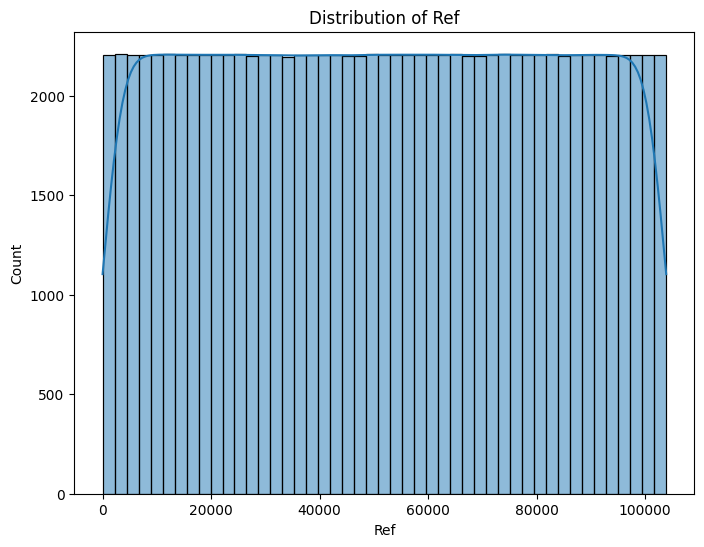

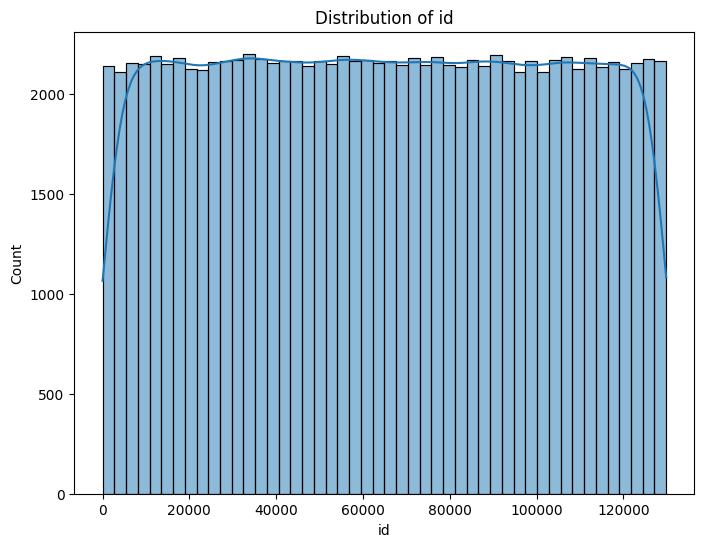

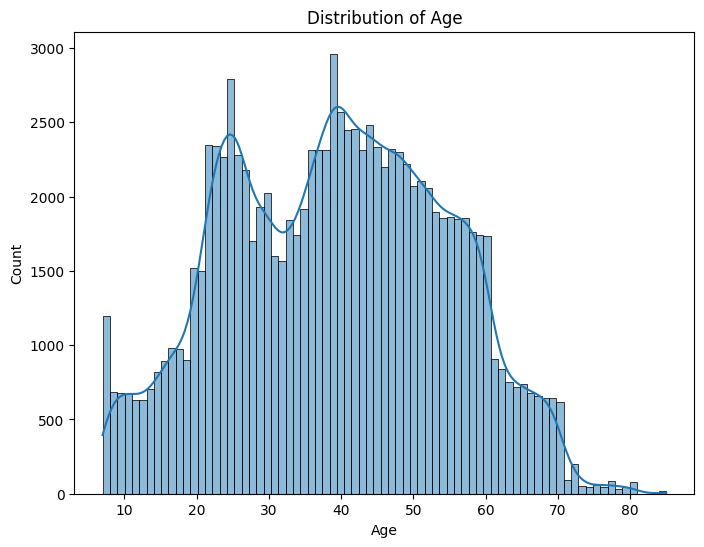

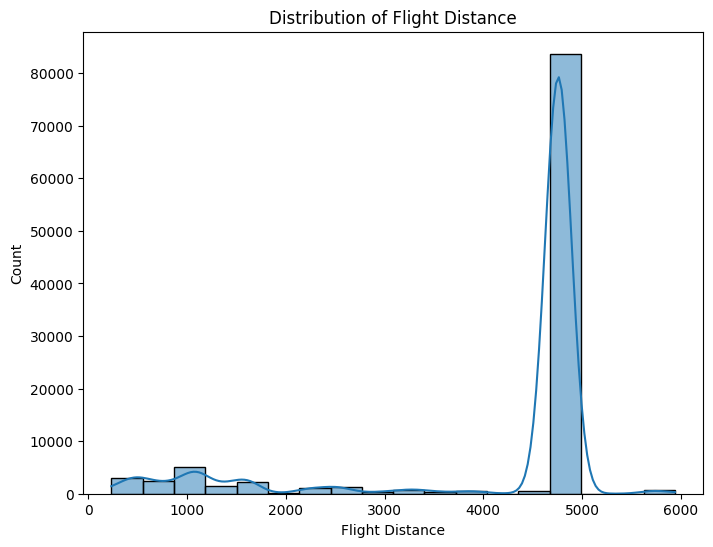

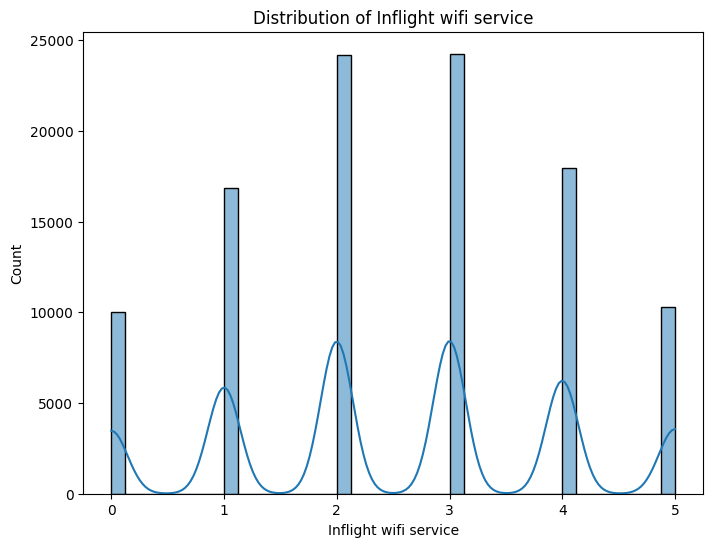

...

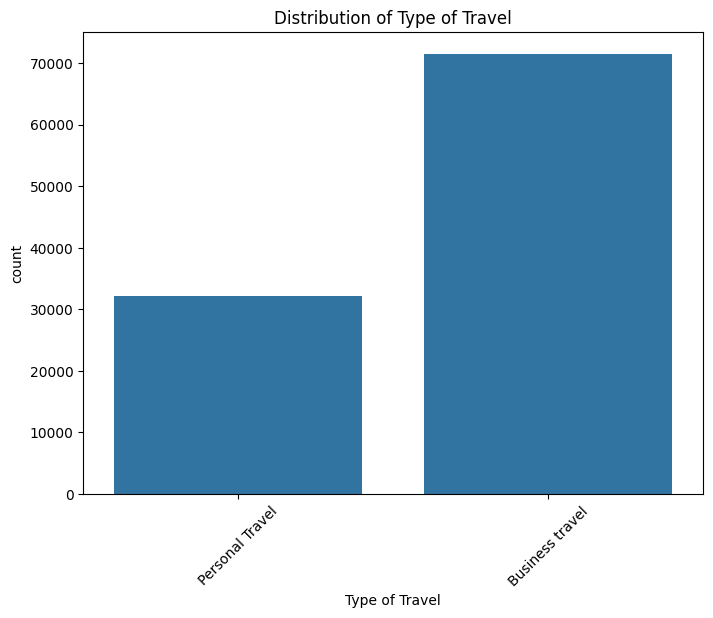

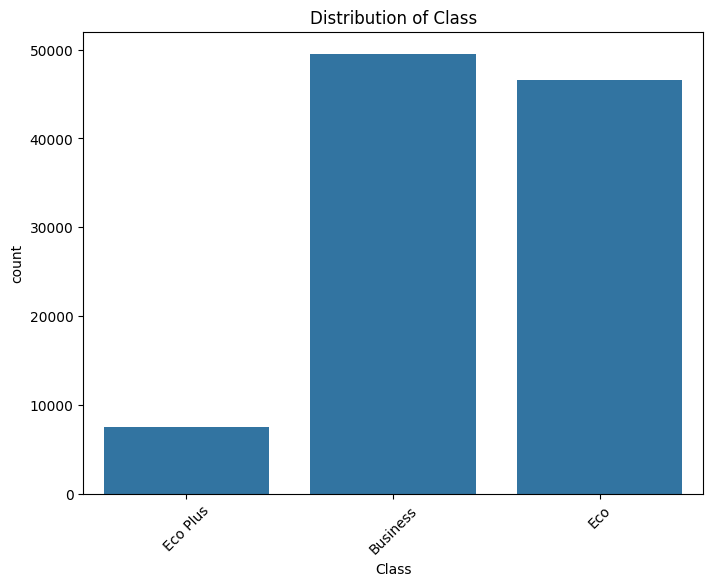

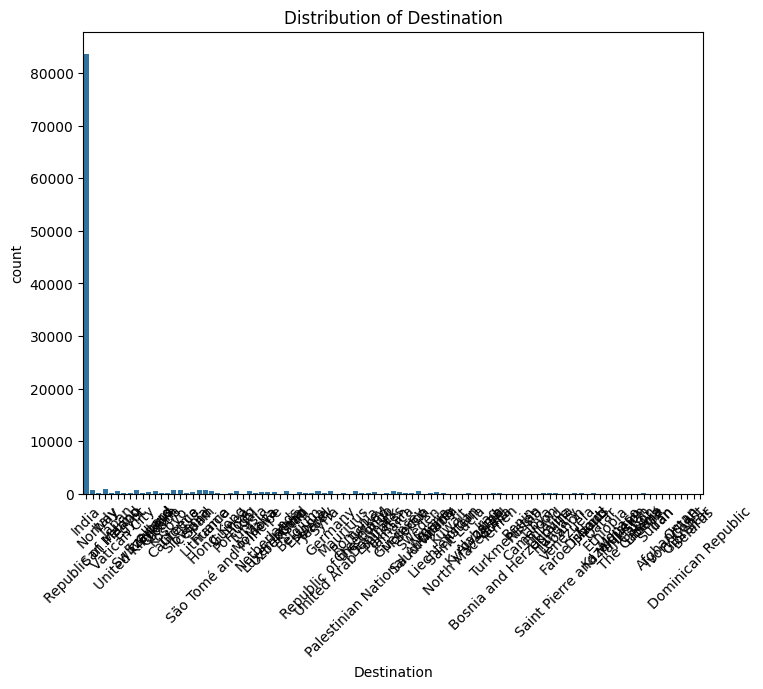

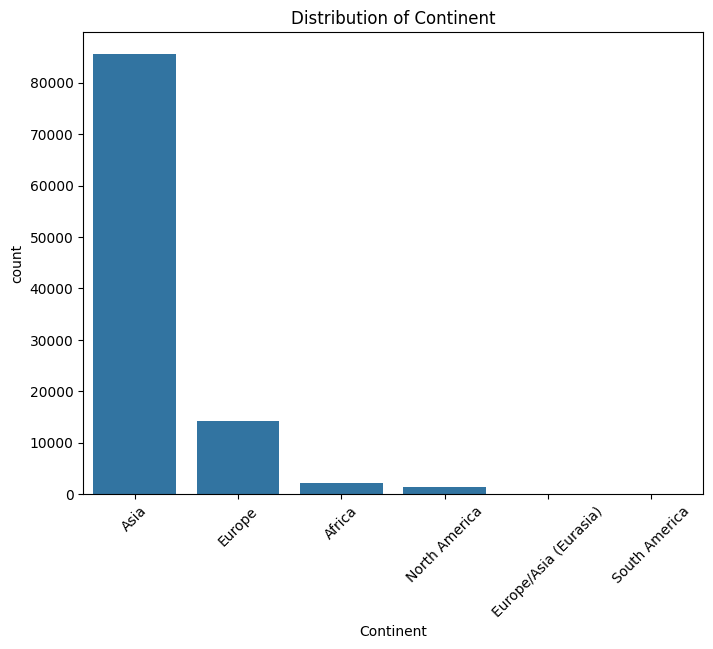

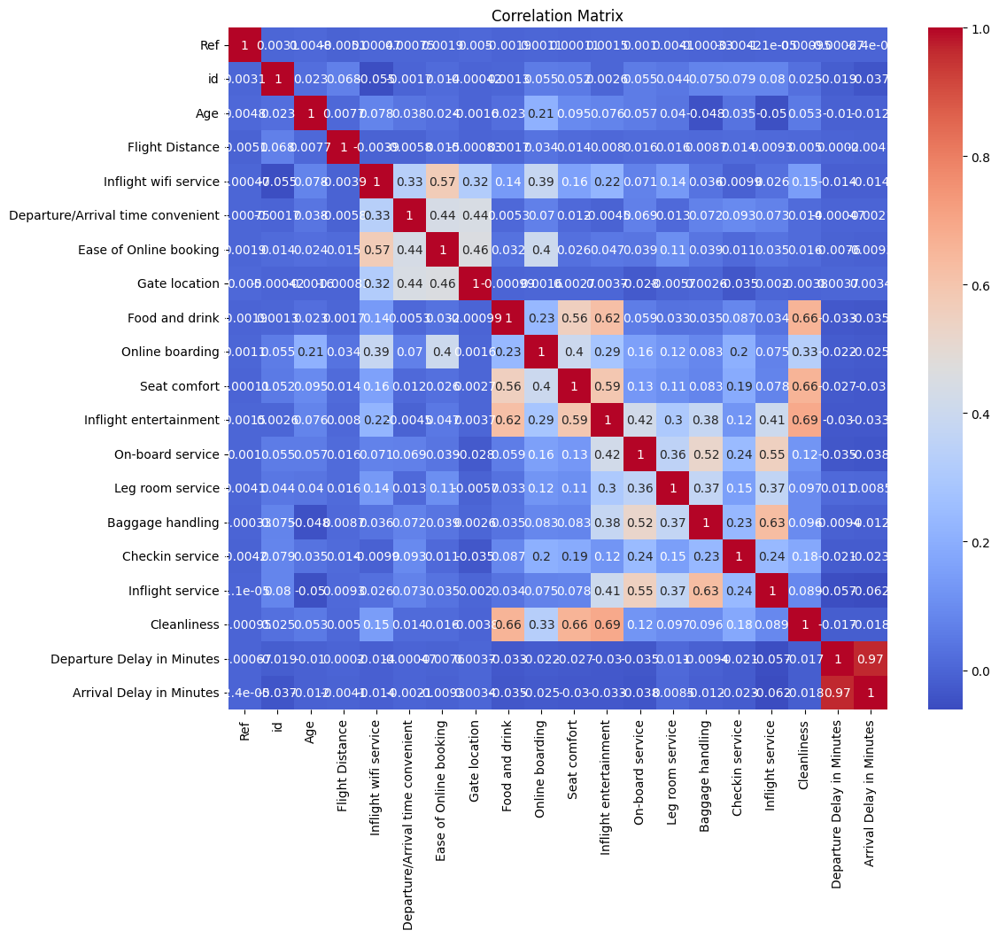

c:\Users\sunda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 0.8597123459570771
Confusion Matrix:
[[ 2218  3457]
 [  903 24501]]
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.39      0.50      5675
           1       0.88      0.96      0.92     25404

    accuracy                           0.86     31079
   macro avg       0.79      0.68      0.71     31079
weighted avg       0.85      0.86      0.84     31079



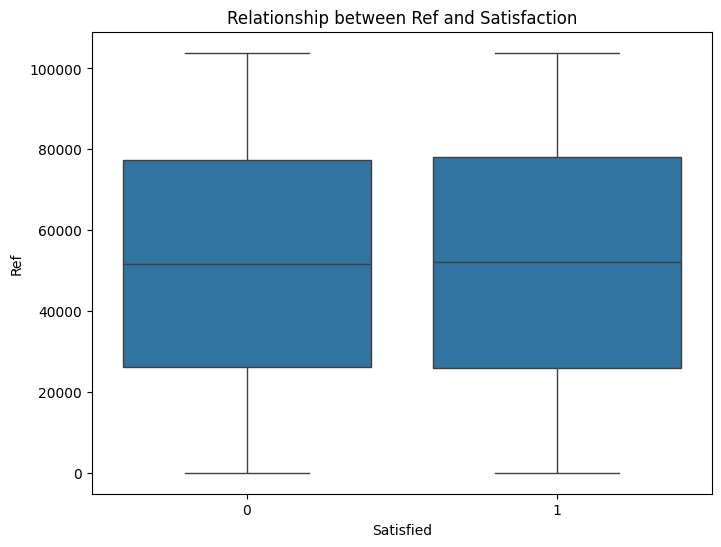

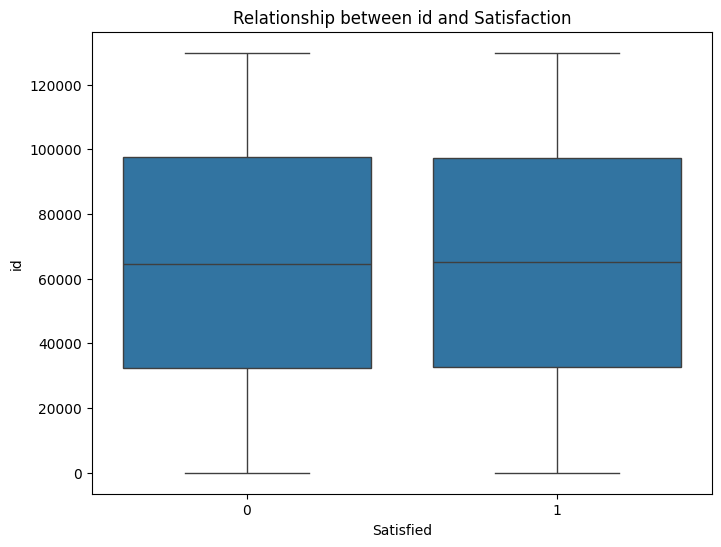

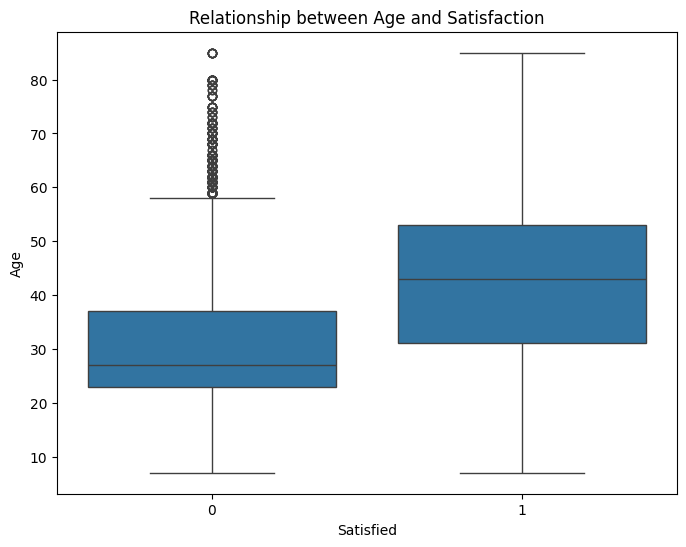

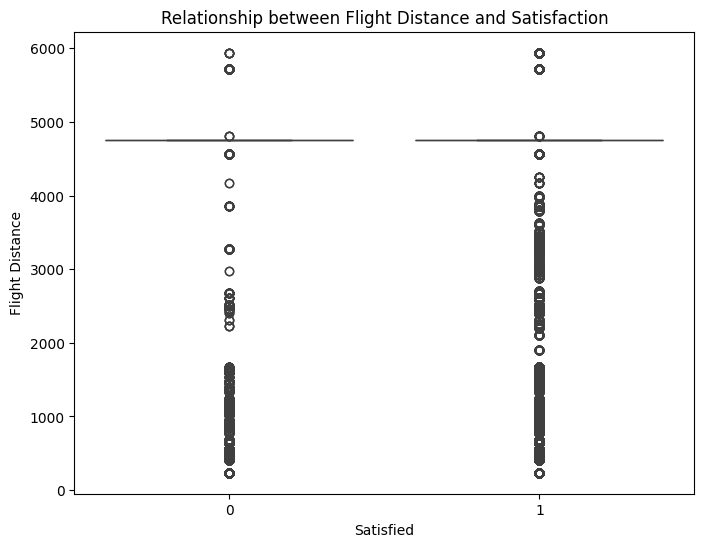

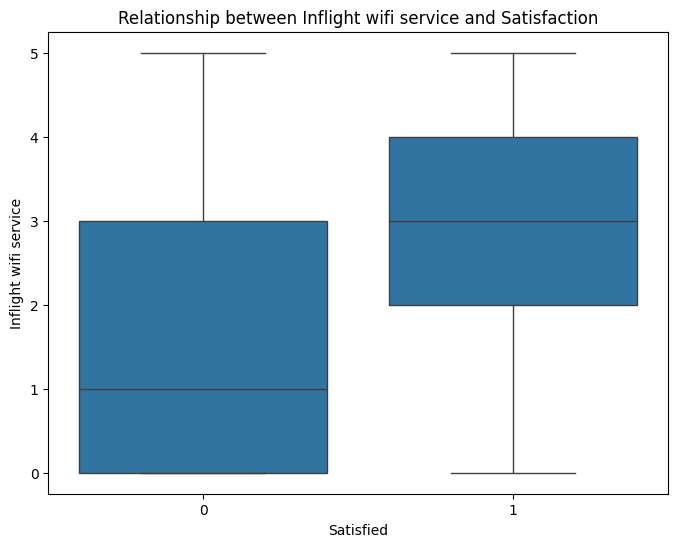

...

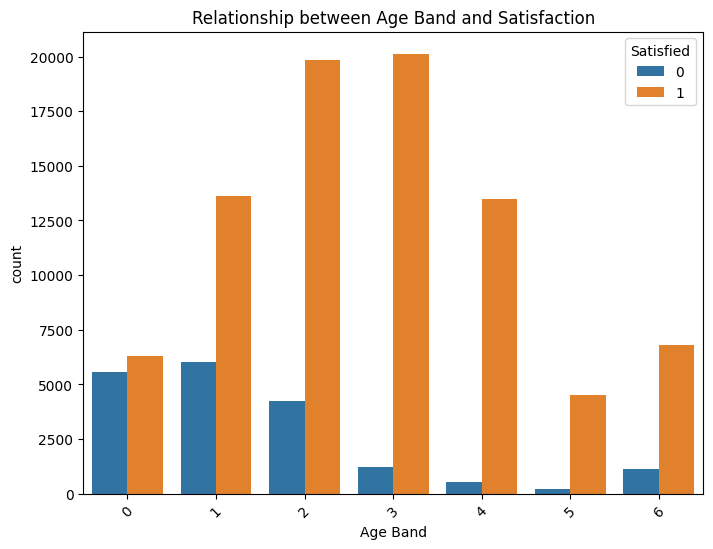

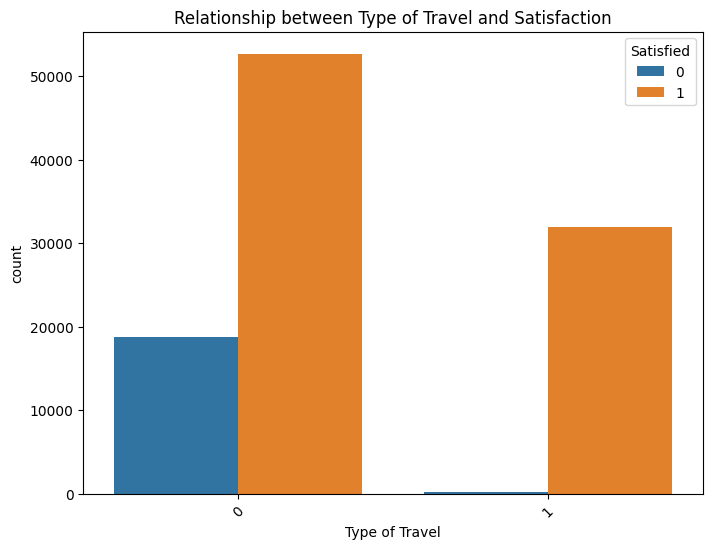

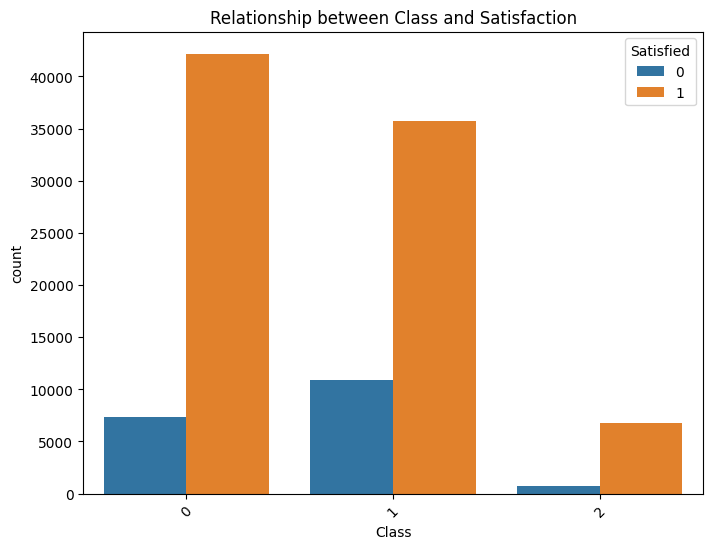

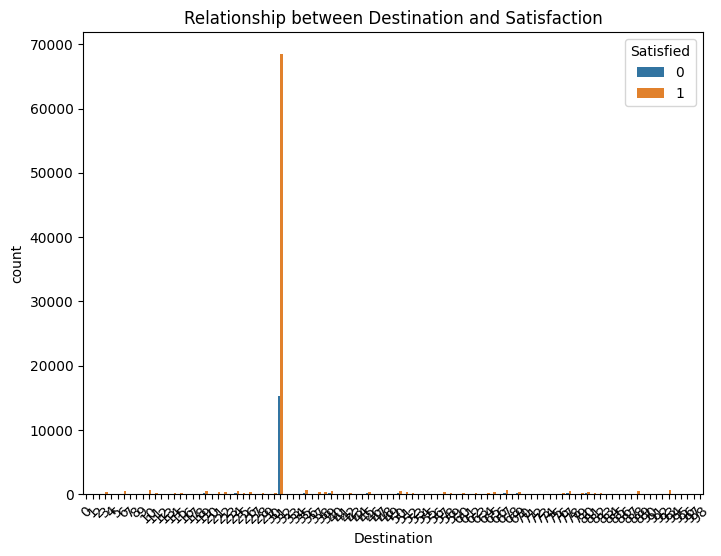

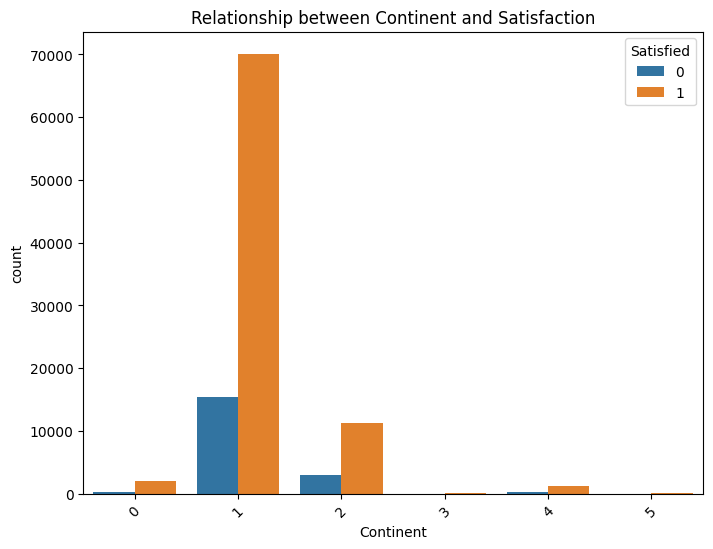

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd  # Import pandas for data handling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load the dataset (replace 'your_file.csv' with your actual file path)
file_path = r'C:\Users\sunda\Desktop\Devops\class 4\SILKYSKY_DATA_CW2 (S).csv'  # Ensure you have the correct file path

# Drop rows with missing values (if any)
data.dropna(inplace=True)

# Explore data distribution for numerical features
numerical_features = data.select_dtypes(include=np.number).columns
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Explore data distribution for categorical features
categorical_features = data.select_dtypes(include='object').columns
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=feature, data=data)
    plt.title(f'Distribution of {feature}')
    plt.xticks(rotation=45)
    plt.show()

# Analyze correlation between features
correlation_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Encode categorical variables for the Logistic Regression model
label_encoder = LabelEncoder()
for feature in categorical_features:
    data[feature] = label_encoder.fit_transform(data[feature])

# Define feature variables (X) and target variable (y)
X = data.drop(columns='Satisfied')  # Assuming 'Satisfied' is the target variable
y = data['Satisfied']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the Logistic Regression classifier
logistic_regressor = LogisticRegression(max_iter=1000)

# Train the Logistic Regression model
logistic_regressor.fit(X_train, y_train)

# Make predictions on the test data
y_pred = logistic_regressor.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)

# Explore the relationship between numerical features and target variable (Satisfied)
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Satisfied', y=feature, data=data)
    plt.title(f'Relationship between {feature} and Satisfaction')
    plt.show()

# Explore the relationship between categorical features and target variable (Satisfied)
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=feature, hue='Satisfied', data=data)
    plt.title(f'Relationship between {feature} and Satisfaction')
    plt.xticks(rotation=45)
    plt.show()


By using navie bayses

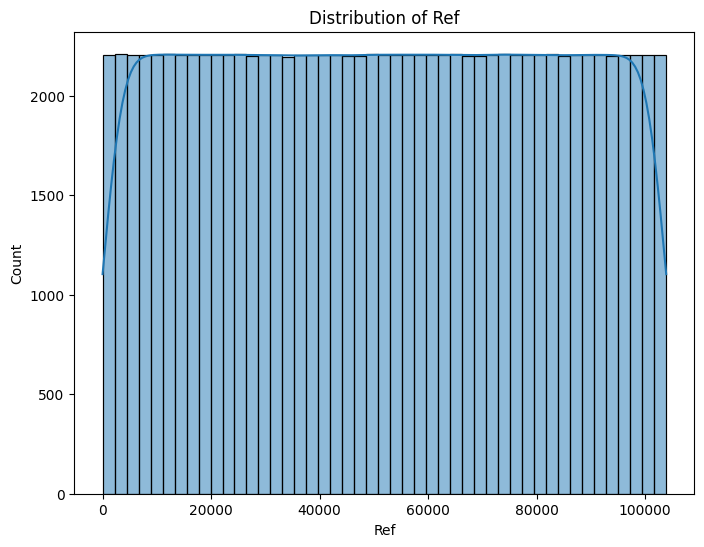

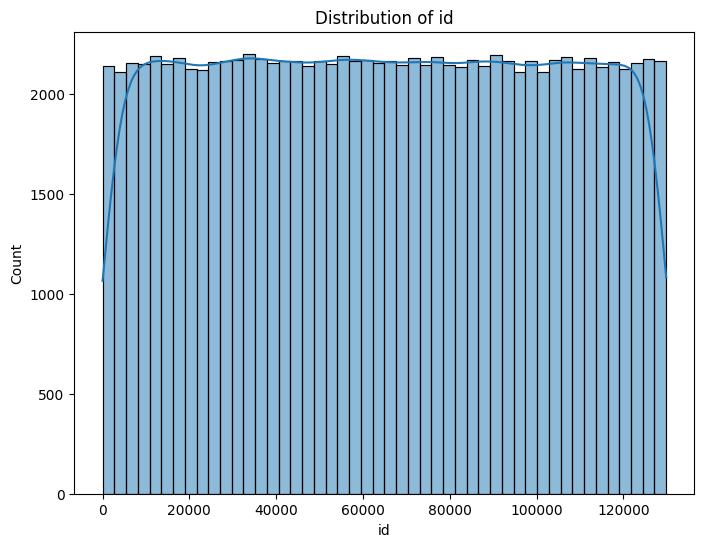

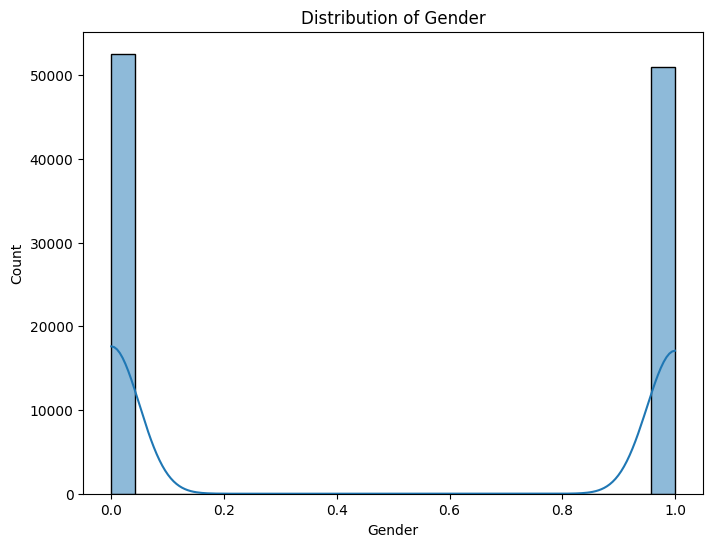

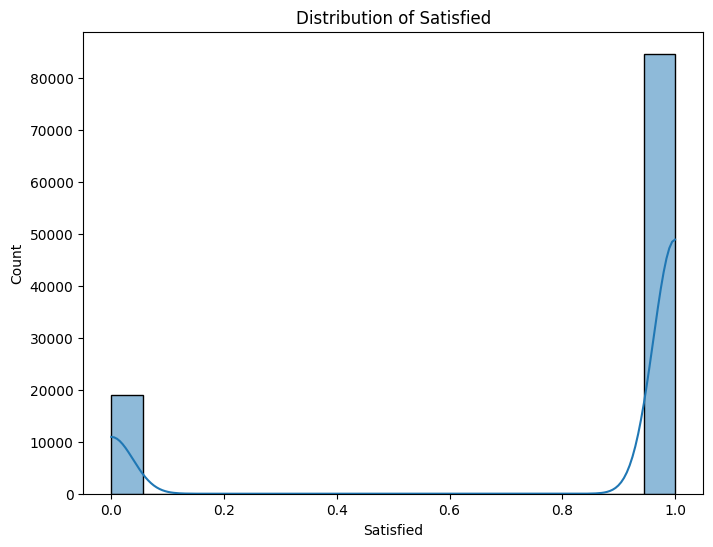

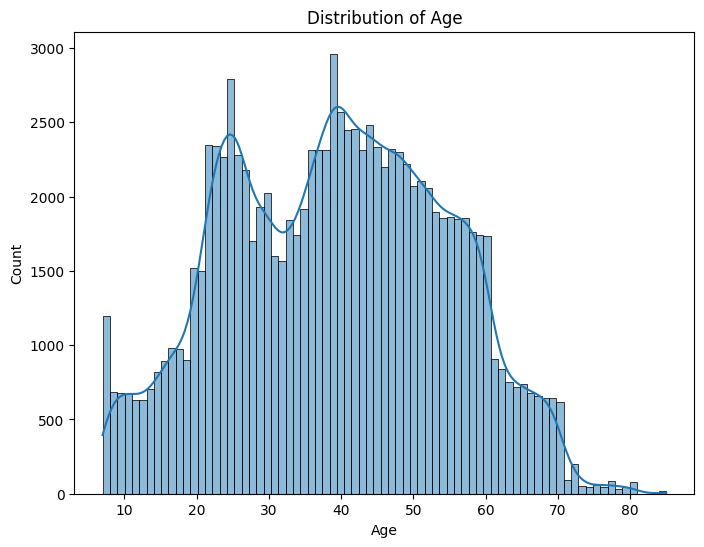

...

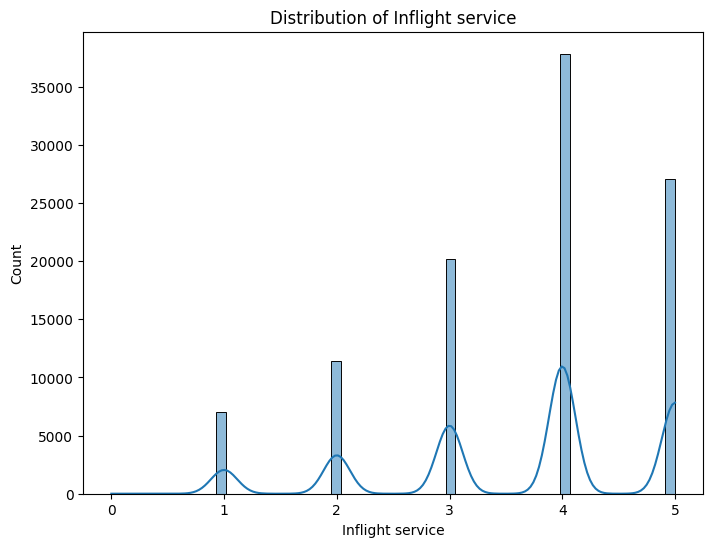

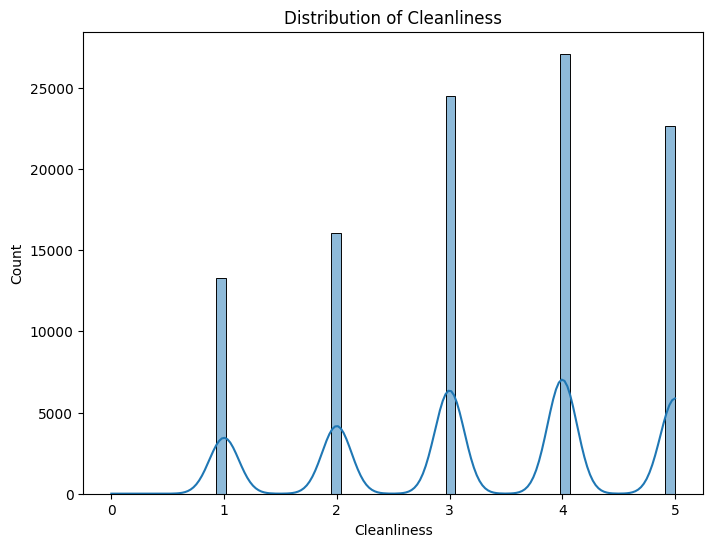

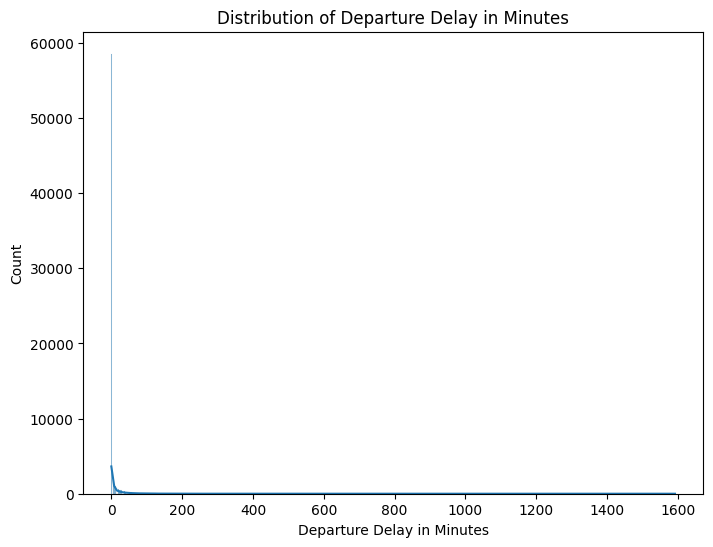

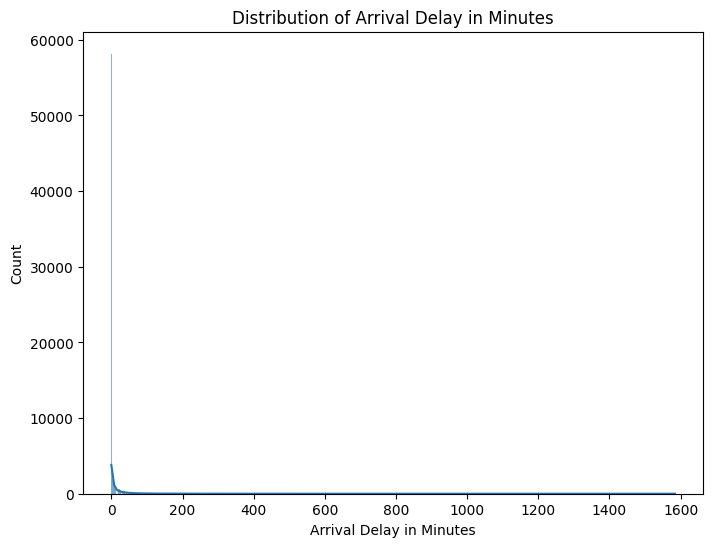

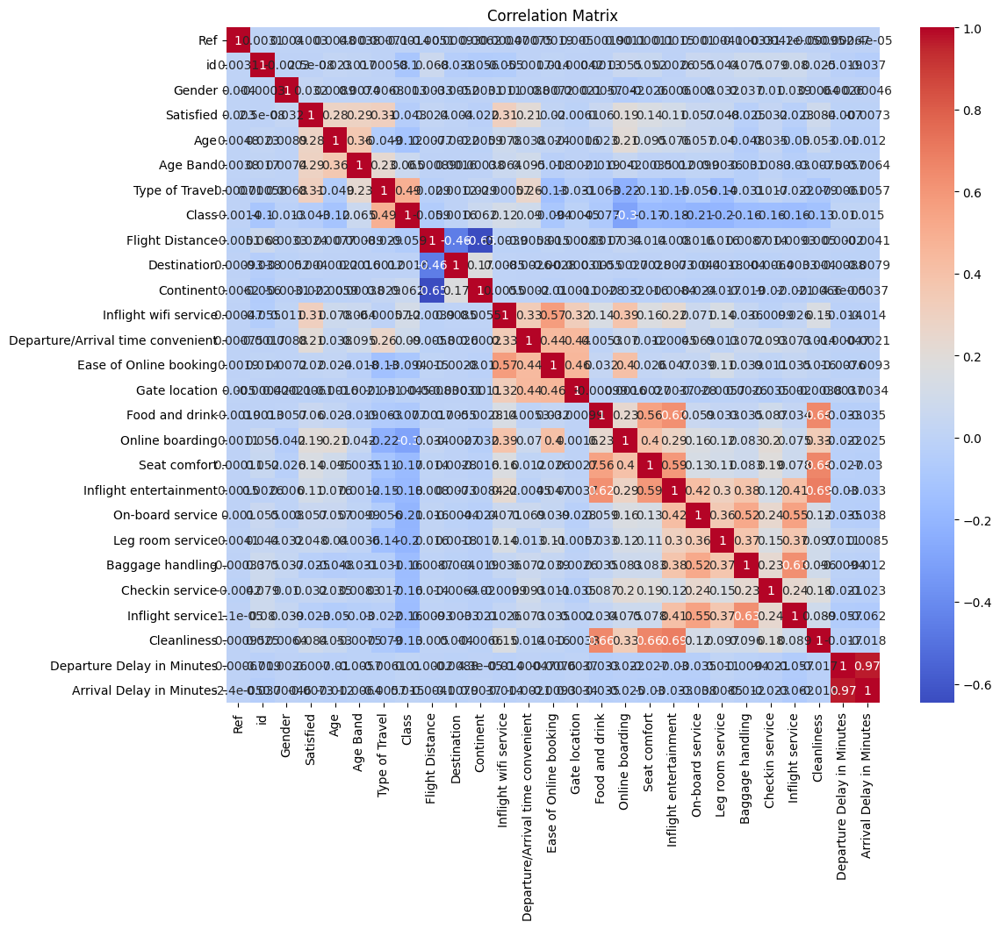

Accuracy: 0.8295633707648251
Confusion Matrix:
[[ 2359  3316]
 [ 1981 23423]]
Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.42      0.47      5675
           1       0.88      0.92      0.90     25404

    accuracy                           0.83     31079
   macro avg       0.71      0.67      0.68     31079
weighted avg       0.82      0.83      0.82     31079



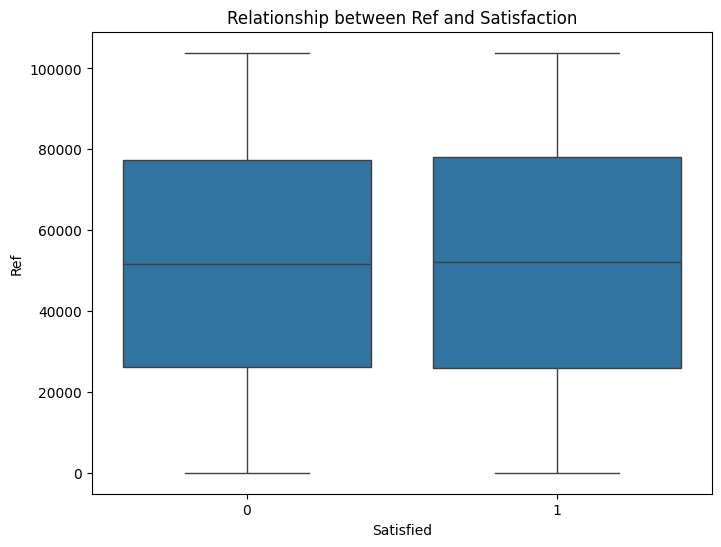

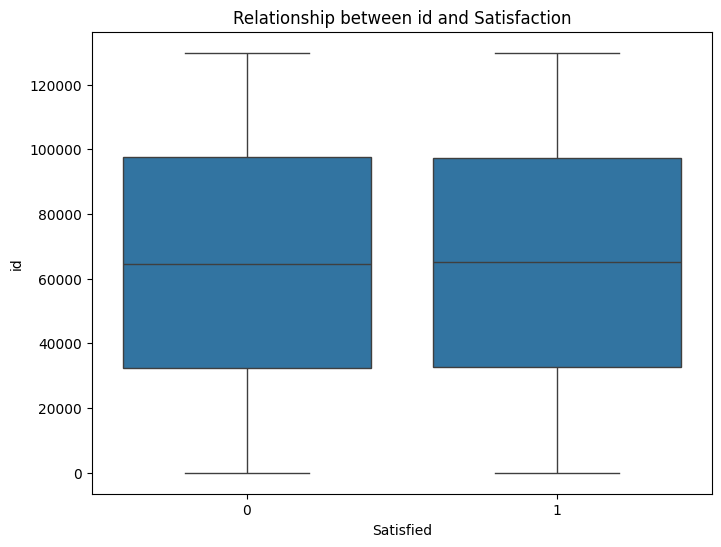

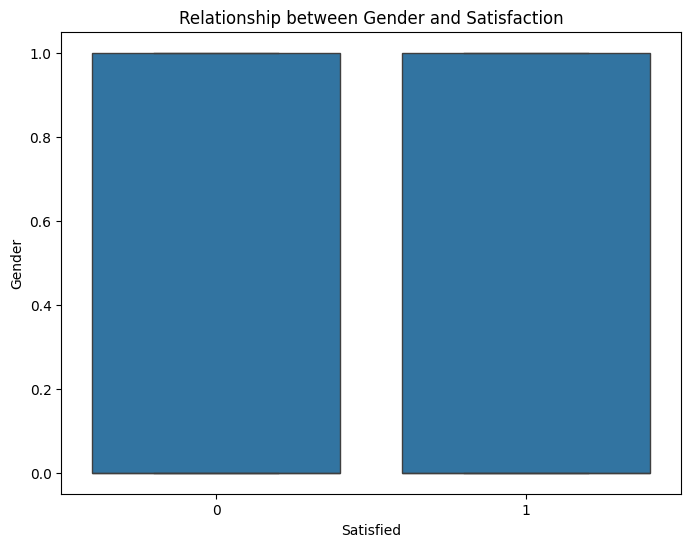

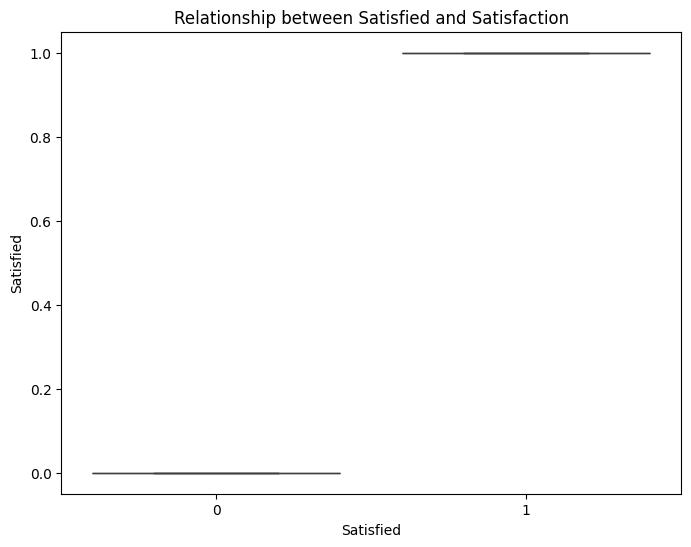

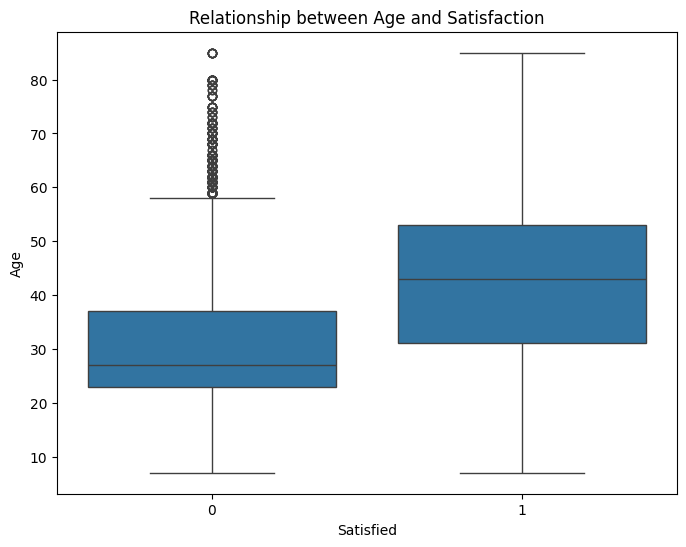

...

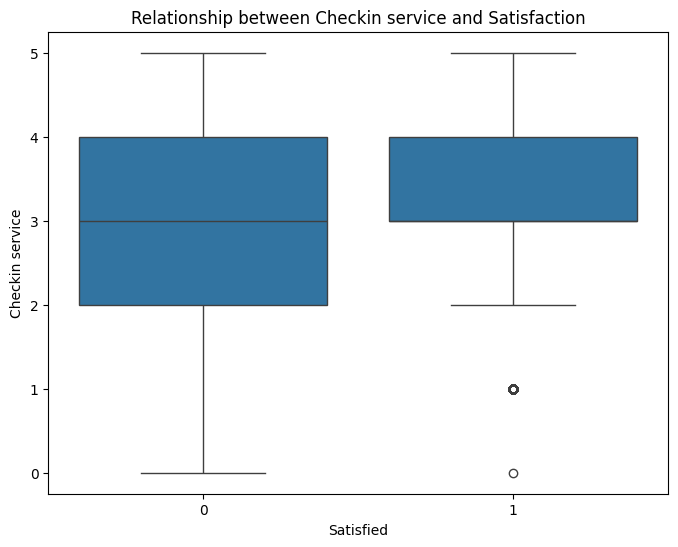

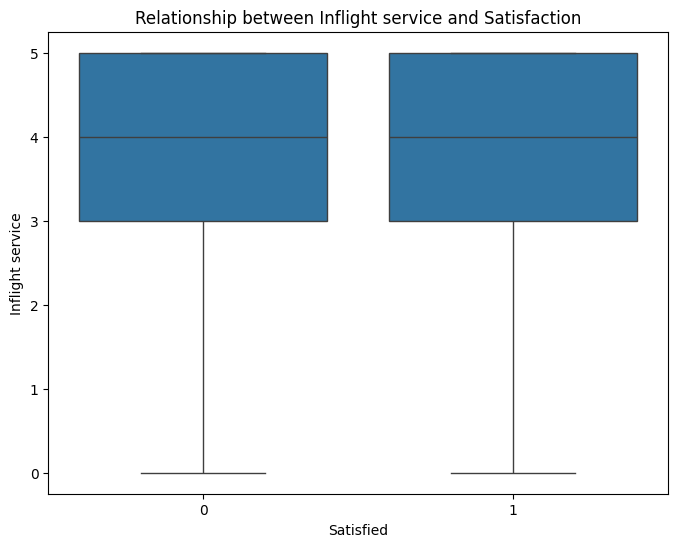

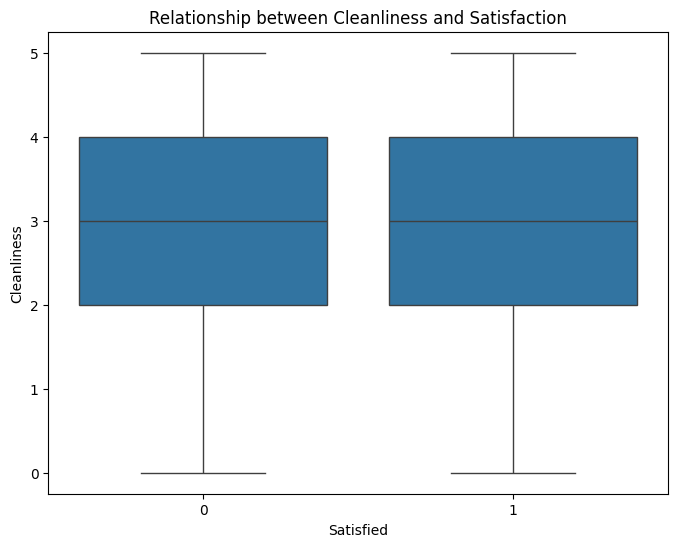

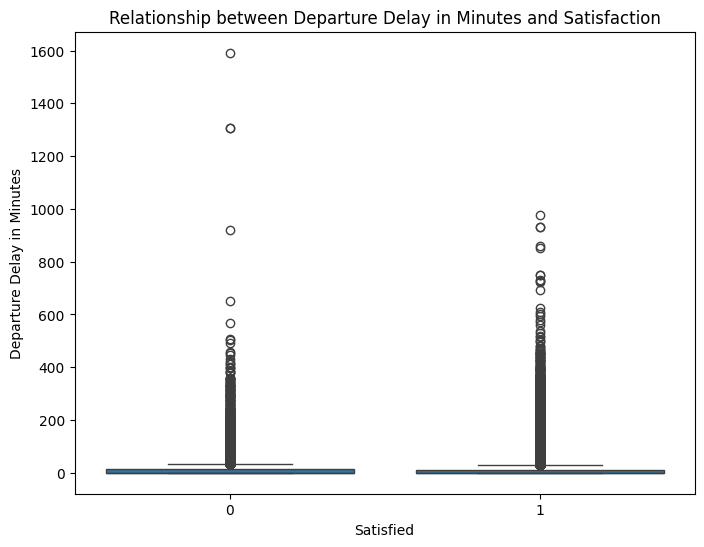

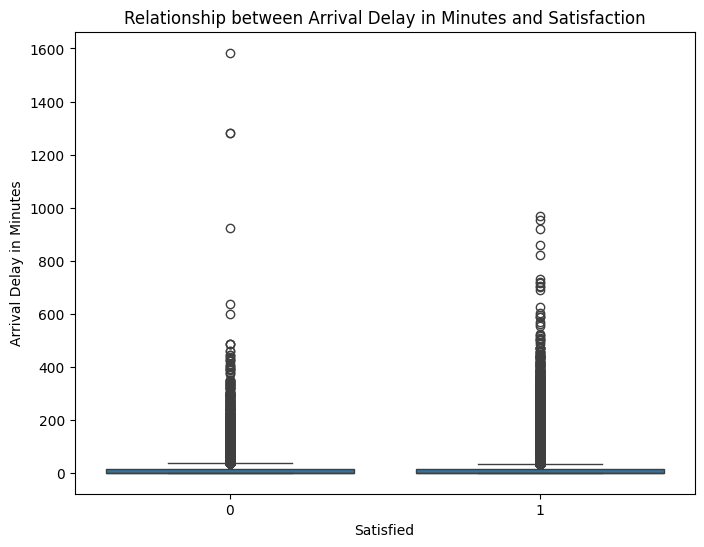

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Drop rows with missing values (if any)
data.dropna(inplace=True)

# Explore data distribution for numerical features
numerical_features = data.select_dtypes(include=np.number).columns
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Explore data distribution for categorical features
categorical_features = data.select_dtypes(include='object').columns
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=feature, data=data)
    plt.title(f'Distribution of {feature}')
    plt.xticks(rotation=45)
    plt.show()

# Analyze correlation between features
correlation_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Encode categorical variables for the Naive Bayes model
label_encoder = LabelEncoder()
for feature in categorical_features:
    data[feature] = label_encoder.fit_transform(data[feature])

# Define feature variables (X) and target variable (y)
X = data.drop(columns='Satisfied')  # Assuming 'Satisfied' is the target variable
y = data['Satisfied']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the Naive Bayes classifier
nb_classifier = GaussianNB()

# Train the Naive Bayes model
nb_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = nb_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)

# Explore the relationship between numerical features and target variable (Satisfied)
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Satisfied', y=feature, data=data)
    plt.title(f'Relationship between {feature} and Satisfaction')
    plt.show()

# Explore the relationship between categorical features and target variable (Satisfied)
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=feature, hue='Satisfied', data=data)
    plt.title(f'Relationship between {feature} and Satisfaction')
    plt.xticks(rotation=45)
    plt.show()


In [15]:
data = pd.get_dummies(data, drop_first=True) #get_dummies() is a function provided by the pandas library that converts categorical variable(s) into dummy/indicator variables.


In [16]:
#Train test Split
X = data.drop('Satisfied', axis=1)  # Replace 'target_column' with your actual target column
y = data['Satisfied']




In [17]:
#  train-test split (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

xgboost :An advanced gradient boosting technique that builds trees sequentially, 
focusing on correcting errors from previous trees for improved performance and efficiency.

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      5675
           1       0.99      1.00      0.99     25404

    accuracy                           0.99     31079
   macro avg       0.99      0.98      0.99     31079
weighted avg       0.99      0.99      0.99     31079

ROC AUC: 0.9840914192291339


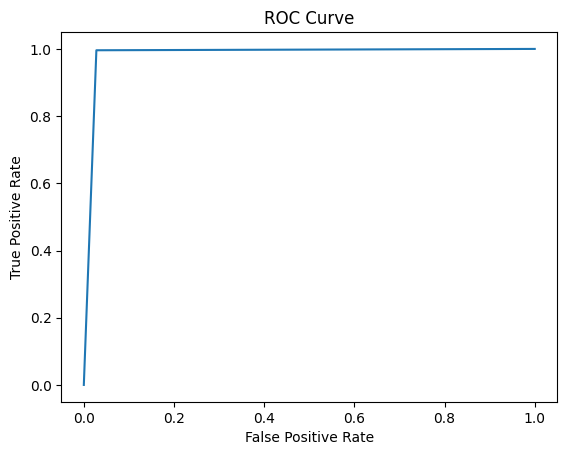

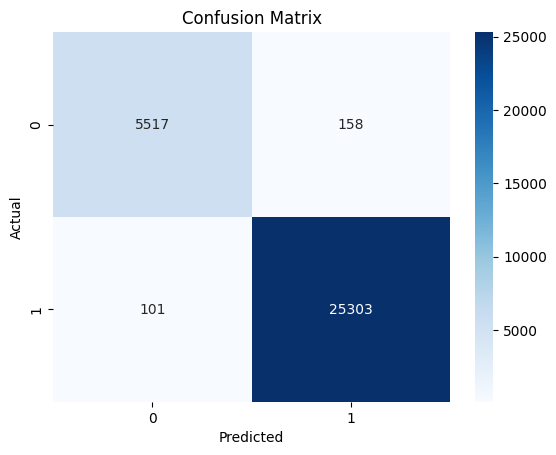

In [20]:

import matplotlib.pyplot as plt
# Install xgboost if not already installed !pip install xgboost

from xgboost import XGBClassifier

# Initialize the XGBoost classifier
xgb_model = XGBClassifier(random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred)
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


random forest:An ensemble method using multiple decision trees that vote on predictions, 
              enhancing accuracy and reducing overfitting

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      5675
           1       0.99      1.00      0.99     25404

    accuracy                           0.99     31079
   macro avg       0.99      0.98      0.98     31079
weighted avg       0.99      0.99      0.99     31079

ROC AUC (Random Forest): 0.9788238315517276


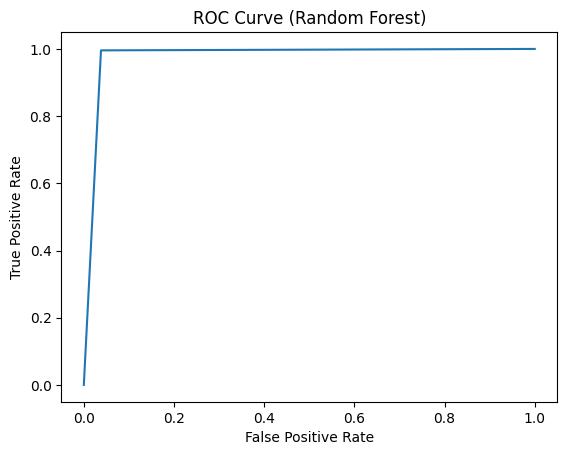

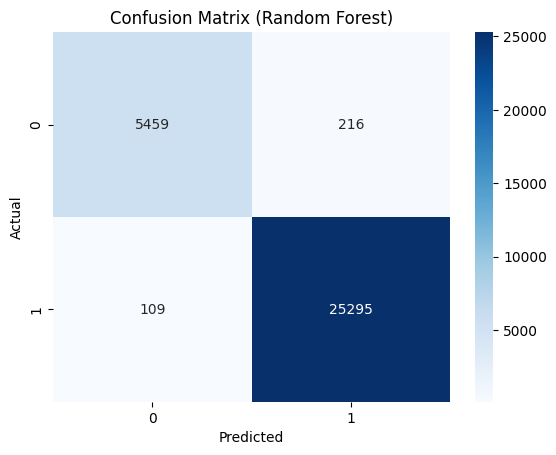

In [22]:


import matplotlib.pyplot as plt
# Initialize the Random Forest classifier
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred_rf))

# Calculate ROC AUC score
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)
print(f'ROC AUC (Random Forest): {roc_auc_rf}')

# Plot ROC curve
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_pred_rf)
plt.plot(fpr_rf, tpr_rf)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Random Forest)')
plt.show()

# Generate confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest)')
plt.show()


In [24]:

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Assuming you have already trained your XGBoost model and have y_test and y_pred

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print the evaluation metrics
print("XGBoost Classifier Evaluation Metrics:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)


XGBoost Classifier Evaluation Metrics:
Accuracy: 0.9916663985327713
Precision: 0.9937944306979302
Recall: 0.9960242481498977
F1-Score: 0.9949080900422688


In [25]:

from sklearn.metrics import roc_auc_score

# Assuming you have already trained your XGBoost model and have y_test and y_pred

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred)

# Print the ROC AUC score
print("ROC AUC Score for XGBoost Classifier:", roc_auc)


ROC AUC Score for XGBoost Classifier: 0.9840914192291339


In [26]:
# Evaluation Metrics for Random Forest
print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))


Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      5675
           1       0.99      1.00      0.99     25404

    accuracy                           0.99     31079
   macro avg       0.99      0.98      0.98     31079
weighted avg       0.99      0.99      0.99     31079



In [27]:


# Calculate ROC AUC score for Random Forest
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)

# Print the ROC AUC score for Random Forest
print("ROC AUC Score for Random Forest Classifier:", roc_auc_rf)


ROC AUC Score for Random Forest Classifier: 0.9788238315517276


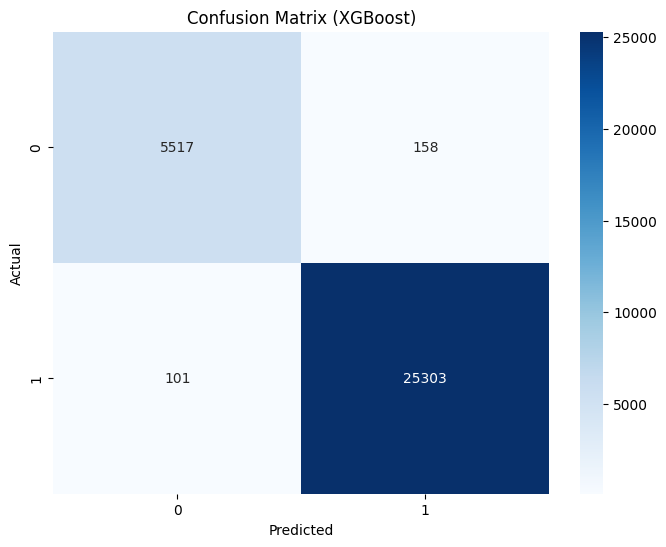

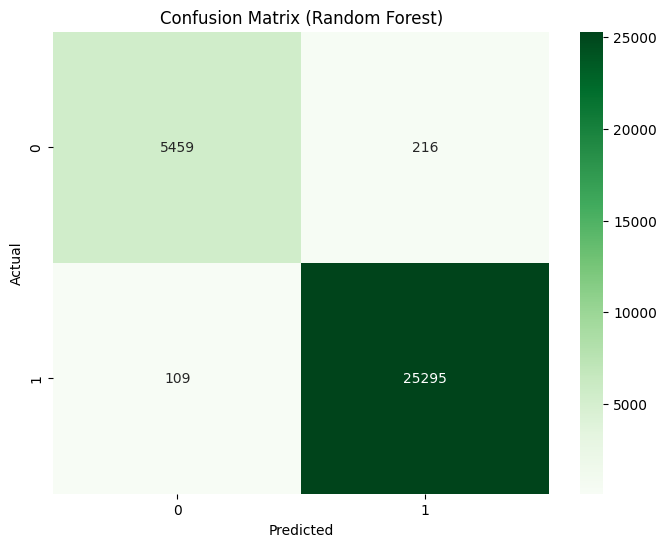

In [28]:

import matplotlib.pyplot as plt
# Generate confusion matrix for XGBoost
cm_xgb = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (XGBoost)')
plt.show()

# Generate confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest)')
plt.show()


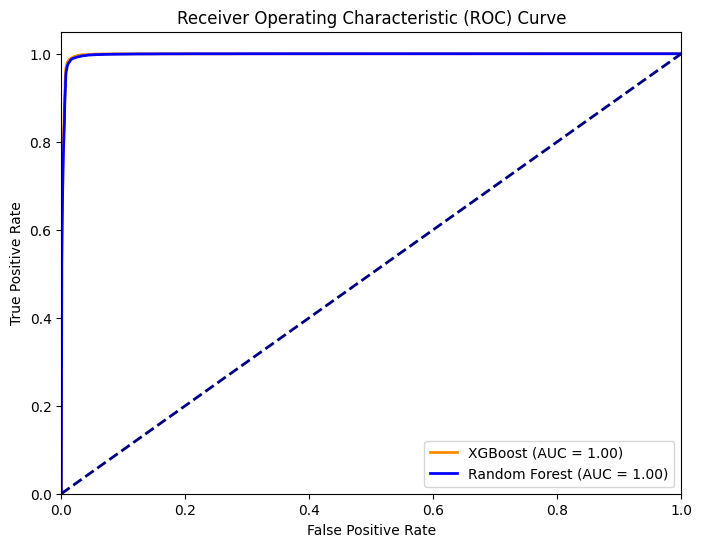

In [29]:

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Generate ROC curve for XGBoost
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test, xgb_model.predict_proba(X_test)[:, 1])
roc_auc_xgb = auc(fpr_xgb, tpr_xgb)

# Generate ROC curve for Random Forest
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1])
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Plot ROC curves for both models
plt.figure(figsize=(8, 6))
plt.plot(fpr_xgb, tpr_xgb, color='darkorange', lw=2, label='XGBoost (AUC = %0.2f)' % roc_auc_xgb)
plt.plot(fpr_rf, tpr_rf, color='blue', lw=2, label='Random Forest (AUC = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


                              Feature  Importance
10              Inflight wifi service    0.219674
5                      Type of Travel    0.141572
6                               Class    0.095865
3                                 Age    0.086283
12             Ease of Online booking    0.065302
11  Departure/Arrival time convenient    0.064578
4                            Age Band    0.055388
15                    Online boarding    0.049357
13                      Gate location    0.031031
17             Inflight entertainment    0.020145
16                       Seat comfort    0.018166
1                                  id    0.018001
22                   Inflight service    0.016143
14                     Food and drink    0.014803
23                        Cleanliness    0.014560
20                   Baggage handling    0.014365
0                                 Ref    0.013714
18                   On-board service    0.011690
19                   Leg room service    0.010838


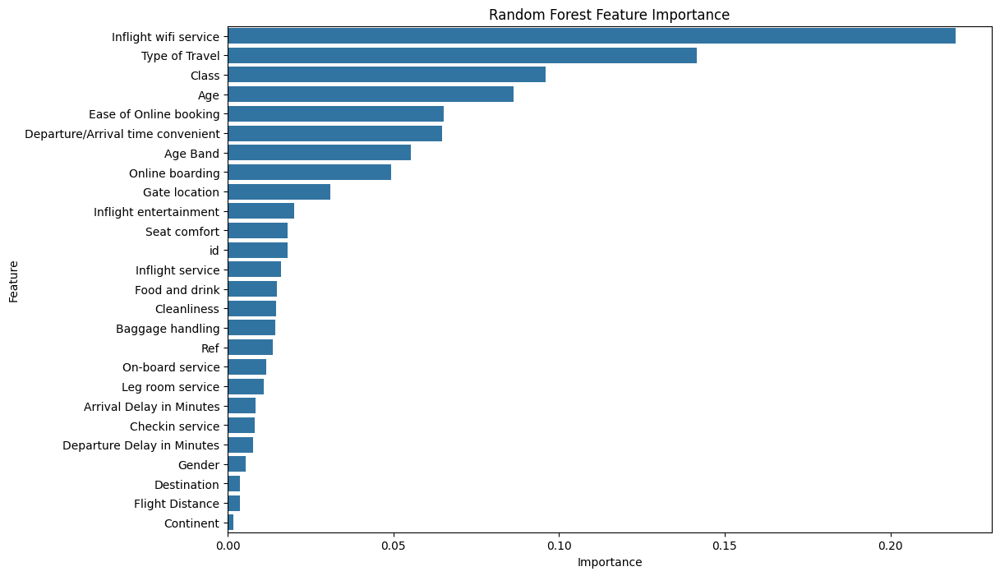

In [30]:

import pandas as pd
import matplotlib.pyplot as plt
# Get feature importances from the trained Random Forest model
importances = rf_model.feature_importances_

# Create a DataFrame to store feature names and their importances
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances_df = feature_importances_df.sort_values('Importance', ascending=False)

# Print the feature importances
print(feature_importances_df)

# Visualize feature importances using a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('Random Forest Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


                              Feature  Importance
5                      Type of Travel    0.296458
6                               Class    0.195941
10              Inflight wifi service    0.194179
12             Ease of Online booking    0.075259
3                                 Age    0.044170
11  Departure/Arrival time convenient    0.038503
17             Inflight entertainment    0.036839
13                      Gate location    0.020442
15                    Online boarding    0.017127
23                        Cleanliness    0.015164
14                     Food and drink    0.011257
4                            Age Band    0.007454
16                       Seat comfort    0.007390
2                              Gender    0.006393
22                   Inflight service    0.005755
20                   Baggage handling    0.004218
18                   On-board service    0.003935
1                                  id    0.002480
25           Arrival Delay in Minutes    0.002427


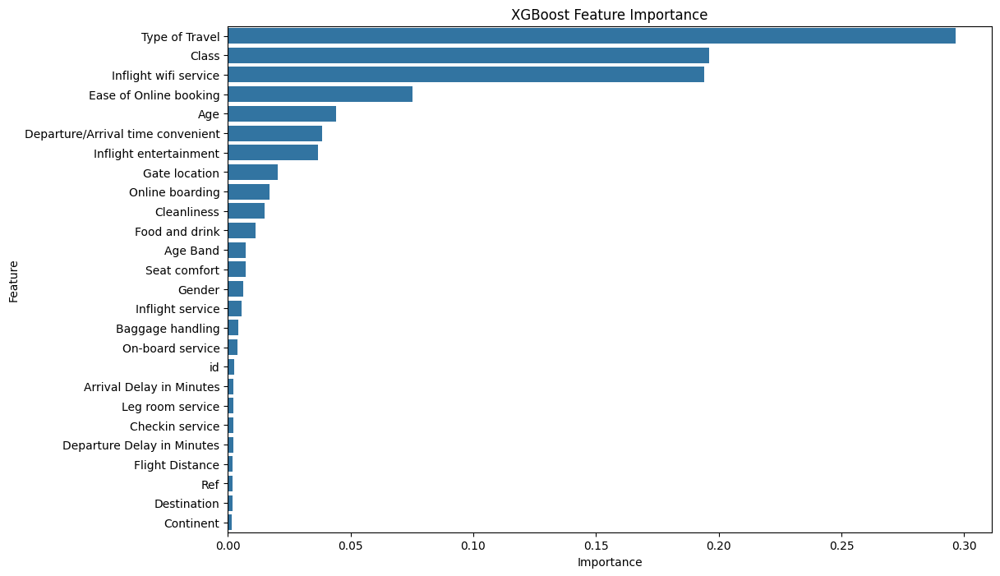

In [31]:

import pandas as pd
import matplotlib.pyplot as plt
# Get feature importances from the trained XGBoost model
importances = xgb_model.feature_importances_

# Create a DataFrame to store feature names and their importances
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances_df = feature_importances_df.sort_values('Importance', ascending=False)

# Print the feature importances
print(feature_importances_df)

# Visualize feature importances using a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('XGBoost Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()



XGBoost Model Performance:
Accuracy: 0.9916663985327713
Precision: 0.9937944306979302
Recall: 0.9960242481498977
F1-Score: 0.9949080900422688
ROC AUC: 0.9840914192291339

Random Forest Model Performance:
Accuracy: 0.9895427780816629
Precision: 0.9915330641683979
Recall: 0.9957093371122658
F1-Score: 0.9936168123342827
ROC AUC: 0.9788238315517276


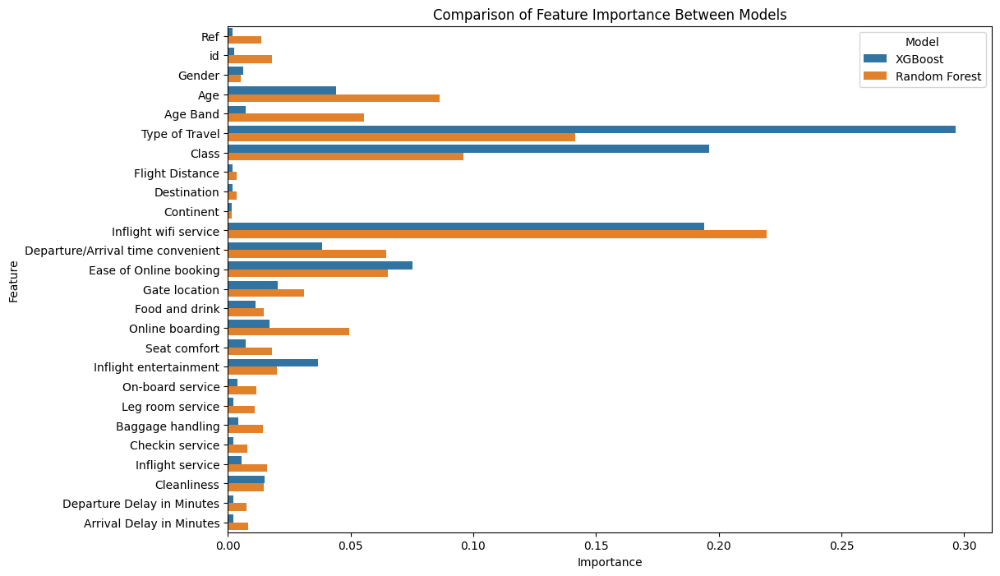

In [32]:

import pandas as pd
import matplotlib.pyplot as plt
# Analyze model performance using different metrics
def analyze_model(model, model_name, X_test, y_test):
  y_pred = model.predict(X_test)
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)
  roc_auc = roc_auc_score(y_test, y_pred)

  print(f"\n{model_name} Model Performance:")
  print("Accuracy:", accuracy)
  print("Precision:", precision)
  print("Recall:", recall)
  print("F1-Score:", f1)
  print("ROC AUC:", roc_auc)


# Analyze both XGBoost and Random Forest models
analyze_model(xgb_model, "XGBoost", X_test, y_test)
analyze_model(rf_model, "Random Forest", X_test, y_test)


# Compare feature importances
def compare_feature_importance(model1, model2, model_name1, model_name2, X_train):
  importances1 = model1.feature_importances_
  importances2 = model2.feature_importances_

  feature_importances_df1 = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances1, 'Model': model_name1})
  feature_importances_df2 = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances2, 'Model': model_name2})

  feature_importances_df = pd.concat([feature_importances_df1, feature_importances_df2])

  plt.figure(figsize=(12, 8))
  sns.barplot(x='Importance', y='Feature', hue='Model', data=feature_importances_df)
  plt.title('Comparison of Feature Importance Between Models')
  plt.xlabel('Importance')
  plt.ylabel('Feature')
  plt.show()

compare_feature_importance(xgb_model, rf_model, "XGBoost", "Random Forest", X_train)
